In [123]:
library(Seurat)
library(Matrix)
library(ggplot2)
library(cowplot)
library(dplyr)
library(enrichR)

In [6]:
library(zinbwave)
library(scRNAseq)
library(matrixStats)
library(magrittr)
library(ggplot2)
library(biomaRt)

In [7]:
library(DEsingle)

In [62]:
load('/home/tsubosaka/stomach_normal_marker/RData/mat_cluster3.Rdata')
load('/home/tsubosaka/stomach_normal_marker/RData/mat_cluster5.Rdata')
load('/home/tsubosaka/stomach_normal_marker/RData/mat_cluster7.Rdata')
load('/home/tsubosaka/stomach_normal_marker/RData/mat_cluster13.Rdata')

In [544]:
# count matrixを統合
countA = as.matrix(cbind(mat_cluster3, mat_cluster5, mat_cluster7, mat_cluster13))

In [ ]:
groupA <- factor(c(rep(3,1237), rep("others",759+641+218)))
groupB <- factor(c(rep("others",1237),rep(5,759),rep("others",641+218)))
groupC <- factor(c(rep('others',1237+759),rep(7,641),rep('others',218)))
groupD <- factor(c(rep('others',1237+759+641),rep(13,218)))

# Generalに
DEs refers to “different expression status”. It is the type of genes that show significant difference in the proportion of real zeros in the two groups, but do not have significant difference in the other cells.

DEa is for “differential expression abundance”, which refers to genes that are significantly differentially expressed between the groups without significant difference in the proportion of real zeros.

DEg or “general differential expression” refers to genes that have significant difference in both the proportions of real zeros and the expression abundances between the two groups.

# Cluster 3についてのDEG

In [ ]:
# Detecting the DE genes
results <- DEsingle(counts = countA, group = groupA)

Removing 14220 rows of genes with all zero counts
Normalizing the data


In [14]:
save(results, file="cluster3_DEG_results.Rdata")

In [12]:
1+1

[1] 2

# Cluster 5についてのDEG

In [ ]:
# Detecting the DE genes
results5 <- DEsingle(counts = countA, group = groupB)

Removing 14220 rows of genes with all zero counts
Normalizing the data


# Cluster 7についてのDEG

In [ ]:
# Detecting the DE genes
results7 <- DEsingle(counts = countA, group = groupC)

# Cluster 13についてのDEG

In [ ]:
# Detecting the DE genes
results11 <- DEsingle(counts = countA, group = groupD)

In [18]:
1+1

[1] 2

In [20]:
save(results5, file="cluster5_DEG_results.Rdata")
save(results7, file="cluster7_DEG_results.Rdata")
save(results11, file="cluster13_DEG_results.Rdata")

In [21]:
results.classified <- DEtype(results = results, threshold = 0.05)

In [22]:
# Extract DE genes at threshold of FDR < 0.05
results.sig <- results.classified[results.classified$pvalue.adj.FDR < 0.05, ]

In [25]:
# Extract three types of DE genes separately
results.DEs <- results.sig[results.sig$Type == "DEs", ]
results.DEa <- results.sig[results.sig$Type == "DEa", ]
results.DEg <- results.sig[results.sig$Type == "DEg", ]

In [77]:
dim(results)

[1] 19318    22

In [36]:
dim(results.sig)
dim(results.DEs)[1]+dim(results.DEa)[1]+dim(results.DEg)[1]

[1] 9708   24

[1] 9708

In [55]:
results5.classified <- DEtype(results = results5, threshold = 0.05)
results7.classified <- DEtype(results = results7, threshold = 0.05)
results13.classified <- DEtype(results = results11, threshold = 0.05)

results5.sig <- results5.classified[results5.classified$pvalue.adj.FDR < 0.05, ]
results7.sig <- results7.classified[results7.classified$pvalue.adj.FDR < 0.05, ]
results13.sig <- results13.classified[results13.classified$pvalue.adj.FDR < 0.05, ]

# Heatmap of expression levels (log(normalized counts + 1)) of top 500 genes of each type of DE genes found by DEsingle in the comparison of E3 versus E4 human preimplantation embryonic cells. Each row illustrates a gene and each column illustrates cell. The color blue is used to represent zero values and the non-zero values are coded by the gradual change of colors from light yellow to deep red. The genes are hierarchically clustered using complete-linkage clustering with Euclidean distance. (B) Histogram of expression levels of three example DE genes, belong to the types of DEs, DEa and DEg, respectively.

In [833]:
results.sig

,theta_1,theta_2,mu_1,mu_2,size_1,size_2,prob_1,prob_2,total_mean_1,total_mean_2,⋯,chi2LR1,pvalue_LR2,pvalue_LR3,FDR_LR2,FDR_LR3,pvalue,pvalue.adj.FDR,Remark,Type,State
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<chr>
ENSG00000169605,0.01093458,6.196852e-09,46.973619,7.085291,1.076917,1.558252e-01,0.02241218,0.02151951,38.8787389,5.95117429,⋯,1740.3478,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,NA,DEg,up
ENSG00000183607,0.03513533,4.727768e-01,10.142119,3.570730,1.289963,2.329661e-01,0.11283707,0.06124729,7.8997575,1.51297899,⋯,1483.8841,1.200444e-02,0.000000e+00,1.356894e-02,0.000000e+00,0,0,NA,DEg,up
ENSG00000160182,0.01515631,6.998523e-09,35.233272,12.465389,1.589248,1.950047e-01,0.04315967,0.01540274,28.8811641,10.71817058,⋯,1417.6531,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,NA,DEg,up
ENSG00000215182,0.02448576,5.108875e-01,14.861055,8.034027,1.234174,2.978864e-01,0.07667950,0.03575246,11.9377526,3.34487021,⋯,1412.3987,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,NA,DEg,up
ENSG00000160181,0.04382323,4.935696e-01,8.769937,7.024616,1.945461,3.595823e-01,0.18155749,0.04869619,6.6839127,2.98022250,⋯,1306.0571,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,NA,DEg,up
ENSG00000163993,0.07832355,5.985960e-01,5.634525,4.542154,3.621323,9.427591e-01,0.39124697,0.17188225,3.9894907,1.43201483,⋯,1107.1200,1.110223e-16,0.000000e+00,1.039434e-15,0.000000e+00,0,0,NA,DEg,up
ENSG00000185499,0.03646365,5.092453e-01,9.228166,5.065243,1.567436,1.347309e+00,0.14519208,0.21010498,7.1398545,1.97589617,⋯,964.0494,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,NA,DEg,up
ENSG00000167653,0.05049146,4.190772e-01,7.856679,5.083352,1.613930,6.866688e-01,0.17041459,0.11900628,5.9086500,2.34857849,⋯,752.1165,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,NA,DEg,up
ENSG00000168631,0.32958236,8.342873e-01,3.922554,3.524501,2.956109,2.079368e+00,0.42975054,0.37105934,1.9207761,0.42954265,⋯,709.2839,0.000000e+00,1.672224e-01,0.000000e+00,2.224941e-01,0,0,NA,DEs,up


In [532]:
results.sig <- results.sig[results.sig$State=='up',]
results5.sig <- results5.sig[results5.sig$State=='up',]
results7.sig <- results7.sig[results7.sig$State=='up',]
results13.sig <- results13.sig[results13.sig$State=='up',]

In [533]:
cluster3_top500genes <- results.sig[order(results.sig$pvalue.adj.FDR),][1:300,]
orderd_cluster3 <- results.sig[order(results.sig$pvalue.adj.FDR),]$Type

In [534]:
cluster5_top500genes <- results5.sig[order(results5.sig$pvalue.adj.FDR),][1:300,]
orderd_cluster5 <- results5.sig[order(results5.sig$pvalue.adj.FDR),]$Type

In [535]:
cluster7_top500genes <- results7.sig[order(results7.sig$pvalue.adj.FDR),][1:300,]
orderd_cluster7 <- results7.sig[order(results7.sig$pvalue.adj.FDR),]$Type

In [536]:
cluster13_top500genes <- results13.sig[order(results13.sig$pvalue.adj.FDR),][1:300,]
orderd_cluster13 <- results13.sig[order(results13.sig$pvalue.adj.FDR),]$Type

In [577]:
cluster3_top500genes <- na.omit(cluster3_top500genes[-22])

In [578]:
dim(cluster3_top500genes)

[1] 191  23

In [574]:
dim(na.omit(cluster5_top500genes[-22]))

[1] 500  23

In [575]:
dim(na.omit(cluster7_top500genes[-22]))

[1] 500  23

In [576]:
dim(na.omit(cluster13_top500genes[-22]))

[1] 500  23

In [579]:
save(cluster3_top500genes, file="RData/cluster3_top500genes.Rdata")
save(cluster5_top500genes, file="RData/cluster5_top500genes.Rdata")
save(cluster7_top500genes, file="RData/cluster7_top500genes.Rdata")
save(cluster13_top500genes, file="RData/cluster13_top500genes.Rdata")

# ensembl ID to gene symbol

In [391]:
save(countA, file='RData/mat_all.RData')

# 解析スタート

In [8]:
load('RData/mat_all.RData') # as countA

In [9]:
load("RData/cluster3_top500genes.Rdata")
load("RData//cluster5_top500genes.Rdata")
load("RData//cluster7_top500genes.Rdata")
load("RData//cluster13_top500genes.Rdata")

In [247]:
mart <- useDataset("hsapiens_gene_ensembl", useMart("ensembl"))

In [248]:
list3 <- rownames(cluster3_top500genes[1:100,])

In [250]:
pair3 <- getBM(filters= "ensembl_gene_id", attributes=c("ensembl_gene_id",'hgnc_symbol'),
              values=list3,mart=mart)

In [260]:
head(pair3)

ensembl_gene_id,hgnc_symbol
<chr>,<chr>
ENSG00000019102,VSIG2
ENSG00000053747,LAMA3
ENSG00000059728,MXD1
ENSG00000064787,BCAS1
ENSG00000066405,CLDN18
ENSG00000073737,DHRS9


In [253]:
cluster3_top100genes <- cluster3_top500genes[1:100,]

In [255]:
cluster3_top100genes["gene_symbol"] <- ""

In [263]:
cluster3_top100genes['ensembl_gene_id'] <- rownames(cluster3_top100genes)

In [295]:
cluster3_top100genes <- cluster3_top100genes[,-25][,-24]

In [293]:
dim(cluster3_top100genes)

[1] 100  25

In [296]:
head(cluster3_top100genes)

,theta_1,theta_2,mu_1,mu_2,size_1,size_2,prob_1,prob_2,total_mean_1,total_mean_2,⋯,norm_foldChange,chi2LR1,pvalue_LR2,pvalue_LR3,FDR_LR2,FDR_LR3,pvalue,pvalue.adj.FDR,Type,State
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
GKN1,0.01093458,6.196852e-09,46.973619,7.085291,1.076917,0.1558252,0.02241218,0.02151951,38.878739,5.951174,⋯,6.557245,1740.348,0.000000e+00,0,0.000000e+00,0,0,0,DEg,up
GKN2,0.03513533,4.727768e-01,10.142119,3.570730,1.289963,0.2329661,0.11283707,0.06124729,7.899757,1.512979,⋯,5.198089,1483.884,1.200444e-02,0,1.356894e-02,0,0,0,DEg,up
TFF1,0.01515631,6.998523e-09,35.233272,12.465389,1.589248,0.1950047,0.04315967,0.01540274,28.881164,10.718171,⋯,2.783649,1417.653,0.000000e+00,0,0.000000e+00,0,0,0,DEg,up
MUC5AC,0.02448576,5.108875e-01,14.861055,8.034027,1.234174,0.2978864,0.07667950,0.03575246,11.937753,3.344870,⋯,3.689277,1412.399,0.000000e+00,0,0.000000e+00,0,0,0,DEg,up
TFF2,0.04382323,4.935696e-01,8.769937,7.024616,1.945461,0.3595823,0.18155749,0.04869619,6.683913,2.980222,⋯,2.357178,1306.057,0.000000e+00,0,0.000000e+00,0,0,0,DEg,up
S100P,0.07832355,5.985960e-01,5.634525,4.542154,3.621323,0.9427591,0.39124697,0.17188225,3.989491,1.432015,⋯,2.848343,1107.120,1.110223e-16,0,1.039434e-15,0,0,0,DEg,up


In [280]:
cluster3_top100genes <- dplyr::inner_join(cluster3_top100genes,pair3,by='ensembl_gene_id')

In [281]:
head(cluster3_top100genes)

theta_1,theta_2,mu_1,mu_2,size_1,size_2,prob_1,prob_2,total_mean_1,total_mean_2,⋯,pvalue_LR2,pvalue_LR3,FDR_LR2,FDR_LR3,pvalue,pvalue.adj.FDR,Type,State,ensembl_gene_id,hgnc_symbol
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>
0.01093458,6.196852e-09,46.973619,7.085291,1.076917,0.1558252,0.02241218,0.02151951,38.878739,5.951174,⋯,0.000000e+00,0,0.000000e+00,0,0,0,DEg,up,ENSG00000169605,GKN1
0.03513533,4.727768e-01,10.142119,3.570730,1.289963,0.2329661,0.11283707,0.06124729,7.899757,1.512979,⋯,1.200444e-02,0,1.356894e-02,0,0,0,DEg,up,ENSG00000183607,GKN2
0.01515631,6.998523e-09,35.233272,12.465389,1.589248,0.1950047,0.04315967,0.01540274,28.881164,10.718171,⋯,0.000000e+00,0,0.000000e+00,0,0,0,DEg,up,ENSG00000160182,TFF1
0.02448576,5.108875e-01,14.861055,8.034027,1.234174,0.2978864,0.07667950,0.03575246,11.937753,3.344870,⋯,0.000000e+00,0,0.000000e+00,0,0,0,DEg,up,ENSG00000215182,MUC5AC
0.04382323,4.935696e-01,8.769937,7.024616,1.945461,0.3595823,0.18155749,0.04869619,6.683913,2.980222,⋯,0.000000e+00,0,0.000000e+00,0,0,0,DEg,up,ENSG00000160181,TFF2
0.07832355,5.985960e-01,5.634525,4.542154,3.621323,0.9427591,0.39124697,0.17188225,3.989491,1.432015,⋯,1.110223e-16,0,1.039434e-15,0,0,0,DEg,up,ENSG00000163993,S100P


In [282]:
rownames(cluster3_top100genes) <- cluster3_top100genes$hgnc_symbol

In [291]:
cluster3_topp100genes <- cluster3_top100genes[,-length(cluster3_top100genes)][,-length(cluster3_top100genes)+1]

In [292]:
cluster3_top100genes

,theta_1,theta_2,mu_1,mu_2,size_1,size_2,prob_1,prob_2,total_mean_1,total_mean_2,⋯,pvalue_LR2,pvalue_LR3,FDR_LR2,FDR_LR3,pvalue,pvalue.adj.FDR,Type,State,ensembl_gene_id,hgnc_symbol
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>
GKN1,0.01093458,6.196852e-09,46.973619,7.085291,1.076917,1.558252e-01,0.02241218,0.02151951,38.8787389,5.95117429,⋯,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,DEg,up,ENSG00000169605,GKN1
GKN2,0.03513533,4.727768e-01,10.142119,3.570730,1.289963,2.329661e-01,0.11283707,0.06124729,7.8997575,1.51297899,⋯,1.200444e-02,0.000000e+00,1.356894e-02,0.000000e+00,0,0,DEg,up,ENSG00000183607,GKN2
TFF1,0.01515631,6.998523e-09,35.233272,12.465389,1.589248,1.950047e-01,0.04315967,0.01540274,28.8811641,10.71817058,⋯,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,DEg,up,ENSG00000160182,TFF1
MUC5AC,0.02448576,5.108875e-01,14.861055,8.034027,1.234174,2.978864e-01,0.07667950,0.03575246,11.9377526,3.34487021,⋯,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,DEg,up,ENSG00000215182,MUC5AC
TFF2,0.04382323,4.935696e-01,8.769937,7.024616,1.945461,3.595823e-01,0.18155749,0.04869619,6.6839127,2.98022250,⋯,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,DEg,up,ENSG00000160181,TFF2
S100P,0.07832355,5.985960e-01,5.634525,4.542154,3.621323,9.427591e-01,0.39124697,0.17188225,3.9894907,1.43201483,⋯,1.110223e-16,0.000000e+00,1.039434e-15,0.000000e+00,0,0,DEg,up,ENSG00000163993,S100P
MUC1,0.03646365,5.092453e-01,9.228166,5.065243,1.567436,1.347309e+00,0.14519208,0.21010498,7.1398545,1.97589617,⋯,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,DEg,up,ENSG00000185499,MUC1
PSCA,0.05049146,4.190772e-01,7.856679,5.083352,1.613930,6.866688e-01,0.17041459,0.11900628,5.9086500,2.34857849,⋯,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,DEg,up,ENSG00000167653,PSCA
MUCL3,0.32958236,8.342873e-01,3.922554,3.524501,2.956109,2.079368e+00,0.42975054,0.37105934,1.9207761,0.42954265,⋯,0.000000e+00,1.672224e-01,0.000000e+00,2.224941e-01,0,0,DEs,up,ENSG00000168631,MUCL3


In [11]:
library(gplots)


Attaching package: ‘gplots’

The following object is masked from ‘package:IRanges’:

    space

The following object is masked from ‘package:S4Vectors’:

    space

The following object is masked from ‘package:stats’:

    lowess



In [583]:
sig_genes <- union(union(union(names3,names5),names7),names13)

In [584]:
sig_matrix = countA[sig_genes,]

In [552]:
head(sig_genes)

[1] "ENSG00000169605" "ENSG00000183607" "ENSG00000160182" "ENSG00000215182"
[5] "ENSG00000160181" "ENSG00000163993"

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------a----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [198]:
sum(sig_matrix[1,])

[1] 41844

In [586]:
sig_matrix_ <- sig_matrix/rowSums(sig_matrix)

In [587]:
sig_matrix_log <- log10(sig_matrix_+1)

In [588]:
sig_matrix2 <- t(scale(t((sig_matrix_log))))

In [392]:
library(circlize)

circlize version 0.4.6
CRAN page: https://cran.r-project.org/package=circlize
Github page: https://github.com/jokergoo/circlize
Documentation: http://jokergoo.github.io/circlize_book/book/

If you use it in published research, please cite:
Gu, Z. circlize implements and enhances circular visualization 
  in R. Bioinformatics 2014.



In [393]:
library(ComplexHeatmap)

Loading required package: grid
ComplexHeatmap version 1.20.0
Bioconductor page: http://bioconductor.org/packages/ComplexHeatmap/
Github page: https://github.com/jokergoo/ComplexHeatmap
Documentation: http://bioconductor.org/packages/ComplexHeatmap/

If you use it in published research, please cite:
Gu, Z. Complex heatmaps reveal patterns and correlations in multidimensional 
  genomic data. Bioinformatics 2016.


Attaching package: ‘ComplexHeatmap’

The following object is masked from ‘package:genefilter’:

    dist2



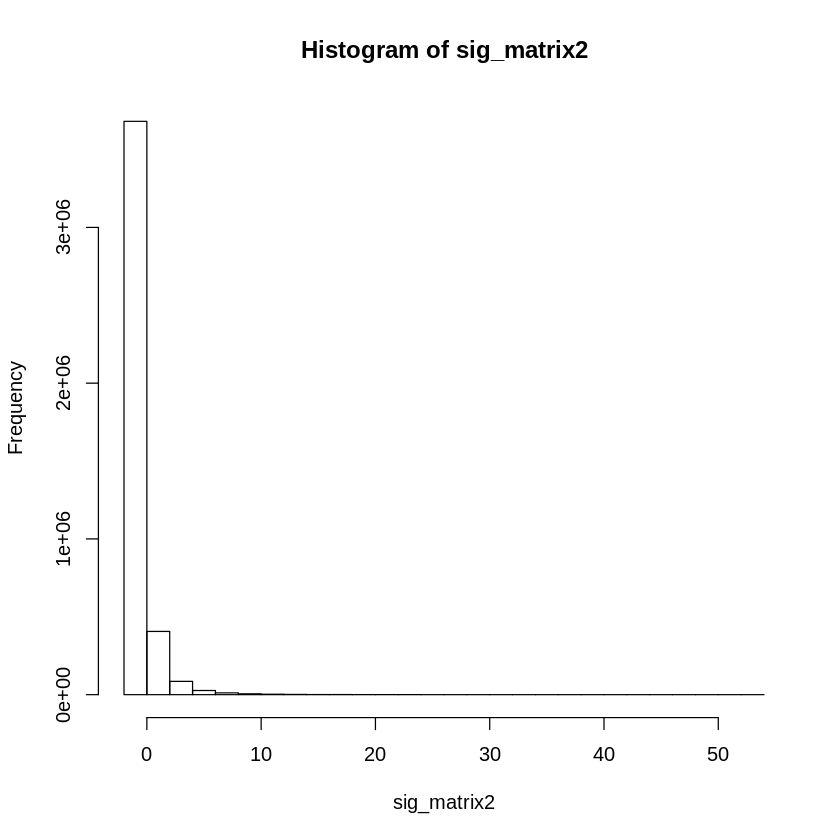

In [589]:
hist(sig_matrix2)

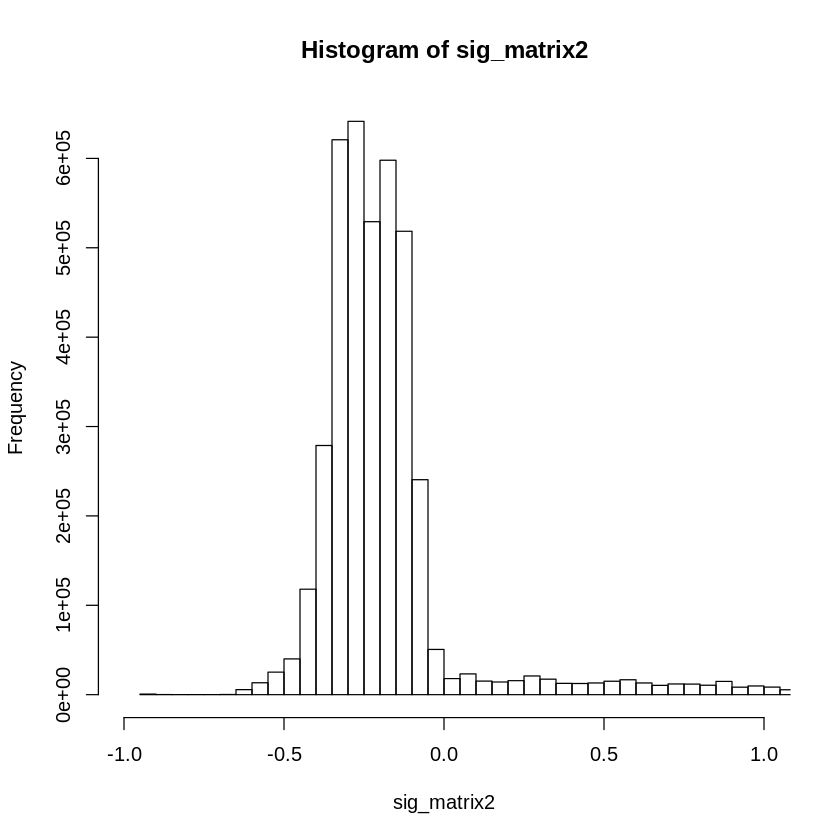

In [590]:
hist(sig_matrix2, breaks=1000, xlim=c(-1,1))

In [591]:
col_fun = colorRamp2(c(-0.5,0,0.5),c('green','white','red'))

In [592]:
ha = HeatmapAnnotation(bar=c(rep("3",1237),rep("5",759),rep("7",641),rep('13',218)),col = list(bar=c('3'='red','5'='green','7'='blue','13'='yellow')))

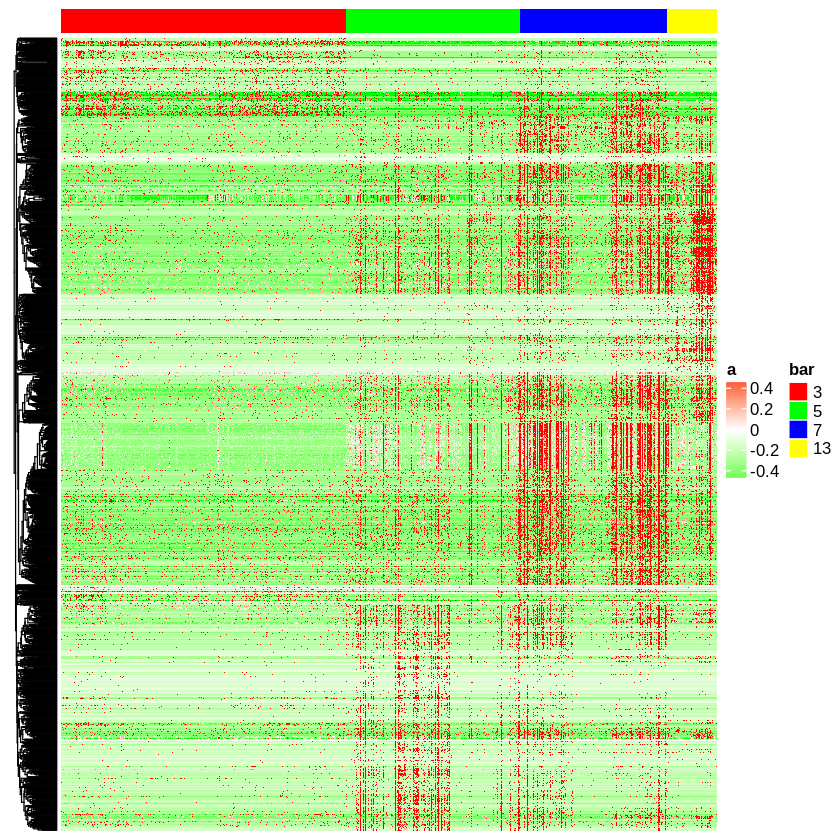

In [593]:
Heatmap(sig_matrix2,name='a',col=col_fun, show_column_names = F,show_column_dend = F, show_row_names = F, top_annotation = ha, cluster_columns = F)

# top 100にする

In [13]:
names3 <- rownames(cluster3_top500genes)[1:100]
names5 <- rownames(cluster5_top500genes)[1:100]
names7 <- rownames(cluster7_top500genes)[1:100]
names13 <- rownames(cluster13_top500genes)[1:100]

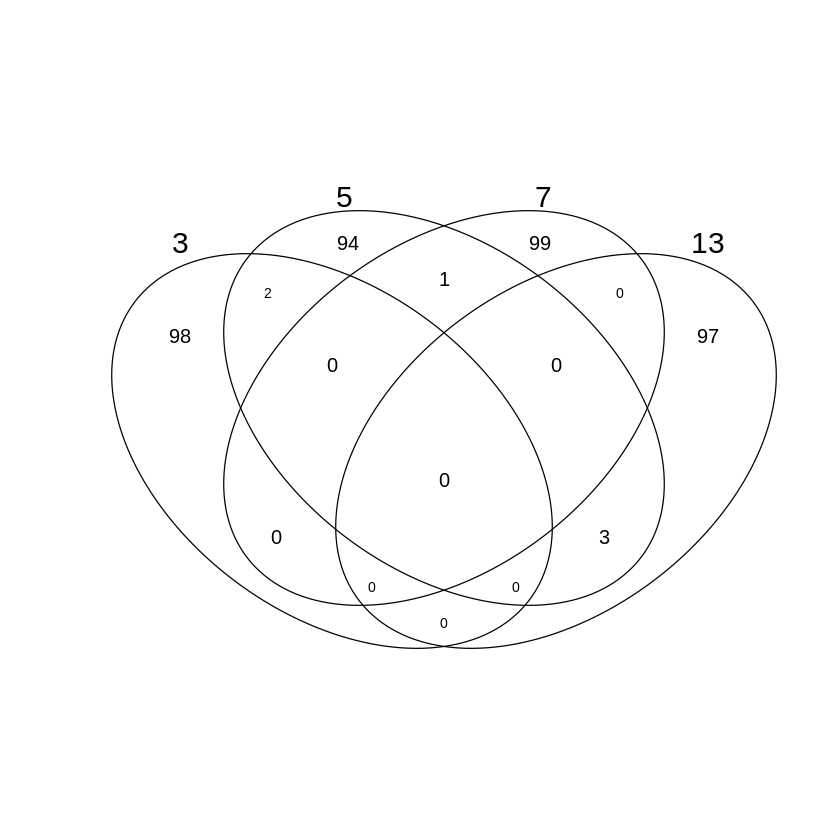

In [14]:
data <- list("3" = names3, "5" = names5, "7" = names7, "13"=names13)
venn(data)

In [15]:
sig_genes <- union(union(union(names3,names5),names7),names13)

In [16]:
length(sig_genes)

[1] 394

In [17]:
sig_matrix = countA[sig_genes,]

In [18]:
sig_matrix_ <- sig_matrix/rowSums(sig_matrix)

In [19]:
sig_matrix_log <- log10(sig_matrix_+1)

In [20]:
sig_matrix2 <- t(scale(t((sig_matrix_log))))

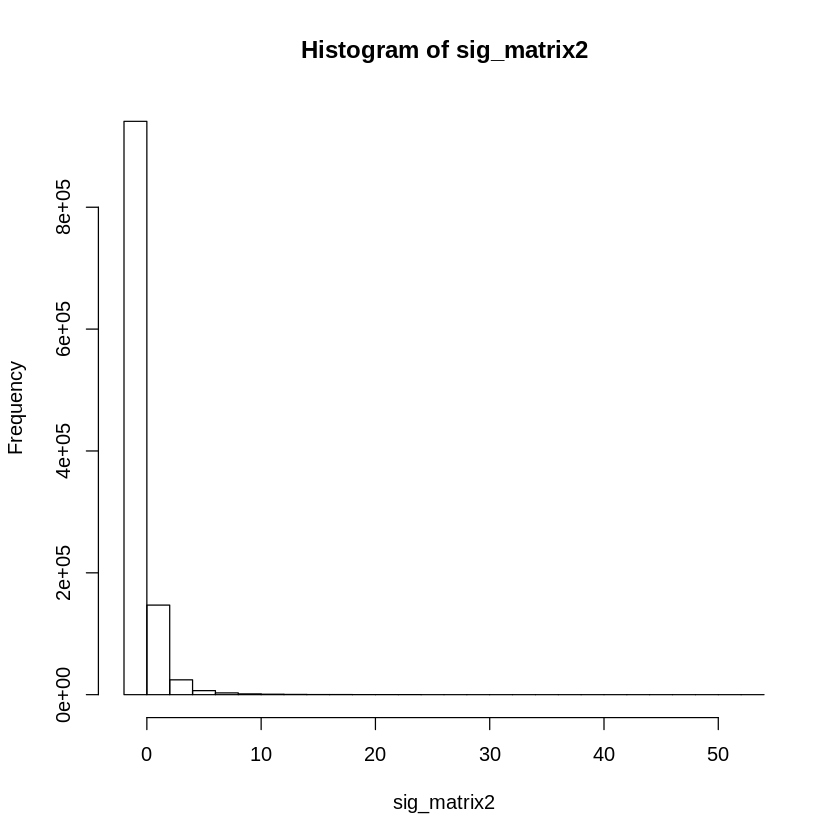

In [21]:
hist(sig_matrix2)

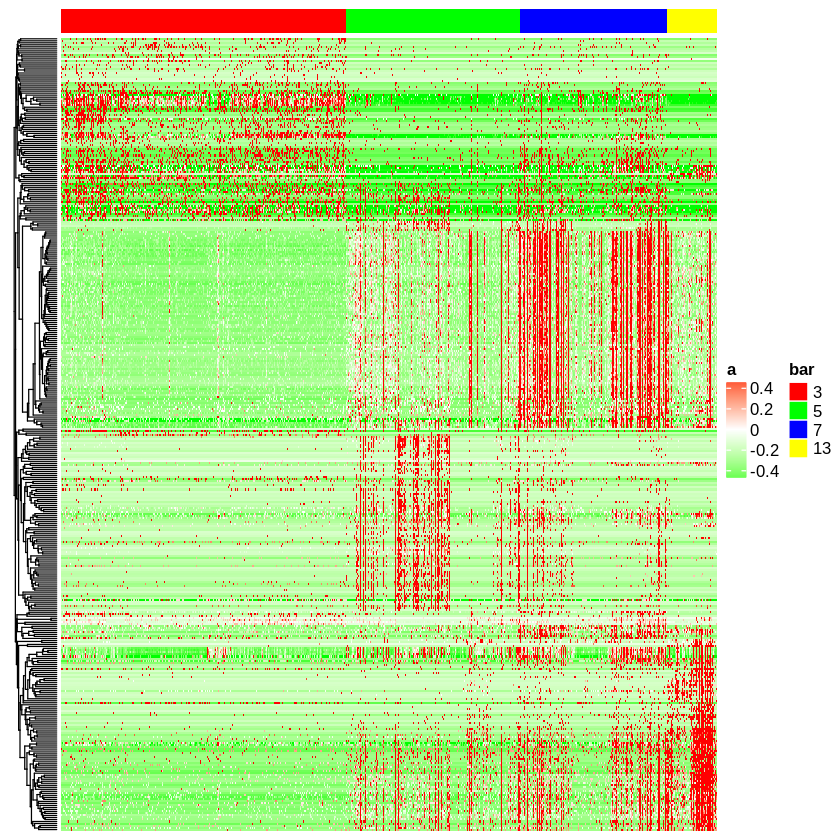

In [566]:
Heatmap(sig_matrix2,name='a',col=col_fun, show_column_names = F,show_column_dend = F, show_row_names = F, top_annotation = ha, cluster_columns = F)

## 各クラスター固有のDEGを調べてみる

In [25]:
library(biomaRt)

In [40]:
library(SeqGSEA)

Loading required package: doParallel
Loading required package: foreach
Loading required package: iterators
Loading required package: DESeq
Loading required package: locfit
locfit 1.5-9.1 	 2013-03-22
Loading required package: lattice
    Welcome to 'DESeq'. For improved performance, usability and
    functionality, please consider migrating to 'DESeq2'.


In [48]:
mart <- useDataset("hsapiens_gene_ensembl", useMart("ensembl"))

In [49]:
list3 <- getBM(filters= "ensembl_gene_id", attributes=c("ensembl_gene_id",'hgnc_symbol'),
              values=names3,mart=mart)

In [50]:
list5 <- getBM(filters= "ensembl_gene_id", attributes=c("ensembl_gene_id",'hgnc_symbol'),
              values=names5,mart=mart)

In [51]:
list7 <- getBM(filters= "ensembl_gene_id", attributes=c("ensembl_gene_id",'hgnc_symbol'),
              values=names7,mart=mart)

In [52]:
list13 <- getBM(filters= "ensembl_gene_id", attributes=c("ensembl_gene_id",'hgnc_symbol'),
              values=names13,mart=mart)

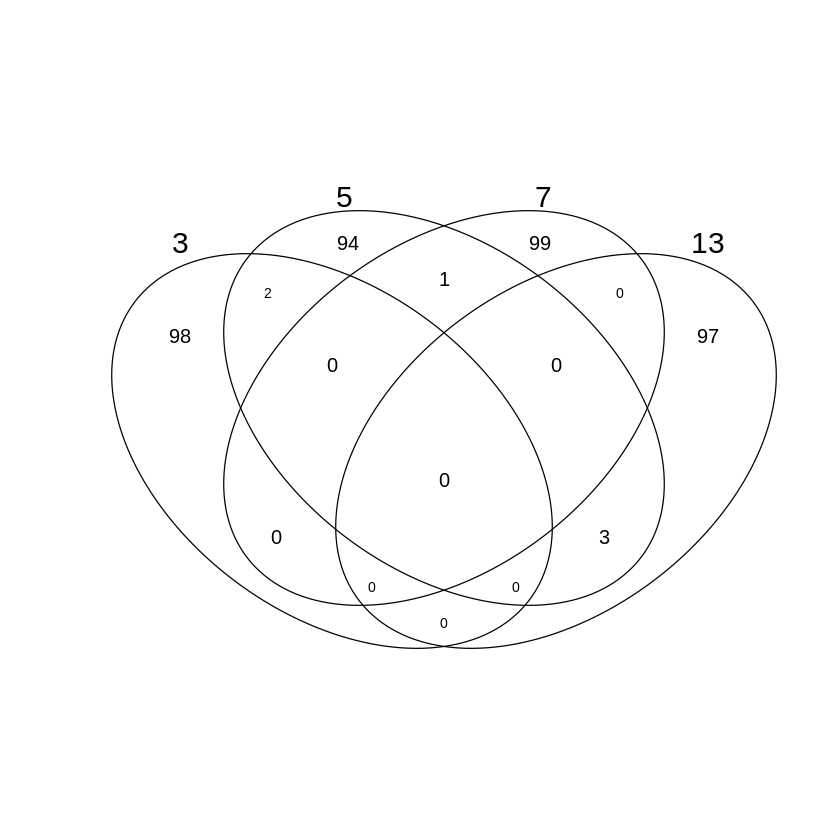

In [53]:
data <- list("3" = list3$hgnc_symbol, "5" = list5$hgnc_symbol, "7" = list7$hgnc_symbol, "13"=list13$hgnc_symbol)
venn(data)

# Cluster 3について

In [54]:
list3_unique = setdiff(setdiff(setdiff(list3$hgnc_symbol,list5$hgnc_symbol),list7$hgnc_symbol),list13$hgnc_symbol)

In [55]:
list3_genes <- list3_unique[!startsWith(list3_unique,'RPL')]

In [56]:
list3_genes <- list3_genes[!startsWith(list3_genes,'MT-')]

In [57]:
list3_genes <- list3_genes[!startsWith(list3_genes,'RPS')]

In [58]:
list3_ensemble <- getBM(filters= "hgnc_symbol", attributes=c("ensembl_gene_id",'hgnc_symbol'),
              values=list3_genes,mart=mart)

In [59]:
head(list3_ensemble)

ensembl_gene_id,hgnc_symbol
<chr>,<chr>
ENSG00000114770,ABCC5
ENSG00000196344,ADH7
ENSG00000124942,AHNAK
ENSG00000187134,AKR1C1
ENSG00000151632,AKR1C2
ENSG00000174501,ANKRD36C


In [60]:
options(repr.plot.width=49, repr.plot.height=7)

In [63]:
# mat_cluster3とlist3_ensembleの共通の遺伝子のみにする
ensembl_gene_id_T <- intersect(list3_ensemble$ensembl_gene_id, rownames(mat_cluster3))

for (i in 1:98){
    ensembl <- ensembl_gene_id_T[i] 
    if(i==1)hoge <- list3_ensemble[list3_ensemble$ensembl_gene_id==ensembl,]
    else{
        hoge <- rbind(hoge,list3_ensemble[list3_ensemble$ensembl_gene_id==ensembl,])
    }
}

list3_ensemble <- hoge

plot_list <- list()

In [64]:
for (i in 0:19){
#1つめ
ensemble1 <- list3_ensemble$ensembl_gene_id[5*i+1]
df <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble1,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble1,]),
cbind(cluster="7",ex=mat_cluster7[ensemble1,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble1,])))

df$ex <- as.numeric(df$ex)
p1 <- ggplot(df,aes(x=cluster,y=ex,colour=cluster))
p1 <- p1+geom_violin(trim=FALSE)+labs(title=paste(list3_ensemble$hgnc_symbol[5*i+1],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 2つめ
ensemble2 <- list3_ensemble$ensembl_gene_id[5*i+2]
df2 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble2,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble2,]),
cbind(cluster="7",ex=mat_cluster7[ensemble2,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble2,])))
df2$ex <- as.numeric(df2$ex)
p2 <- ggplot(df2,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p2 <- p2+geom_violin(trim=FALSE)+labs(title=paste(list3_ensemble$hgnc_symbol[5*i+2],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# ３つ目
ensemble3 <- list3_ensemble$ensembl_gene_id[5*i+3]
df3 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble3,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble3,]),
cbind(cluster="7",ex=mat_cluster7[ensemble3,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble3,])))
df3$ex <- as.numeric(df3$ex)
p3 <- ggplot(df3,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p3 <- p3+geom_violin(trim=FALSE)+labs(title=paste(list3_ensemble$hgnc_symbol[5*i+3],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 4つめ
ensemble4 <- list3_ensemble$ensembl_gene_id[5*i+4]
df4 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble4,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble4,]),
cbind(cluster="7",ex=mat_cluster7[ensemble4,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble4,])))
df4$ex <- as.numeric(df4$ex)
p4 <- ggplot(df4,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p4 <- p4+geom_violin(trim=FALSE)+labs(title=paste(list3_ensemble$hgnc_symbol[5*i+4],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 5つめ
ensemble5 <- list3_ensemble$ensembl_gene_id[5*i+5]
df5 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble5,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble5,]),
cbind(cluster="7",ex=mat_cluster7[ensemble5,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble5,])))
df5$ex <- as.numeric(df5$ex)
p5 <- ggplot(df5,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p5 <- p5+geom_violin(trim=FALSE)+labs(title=paste(list3_ensemble$hgnc_symbol[5*i+5],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

plot_list[[5*i+1]] <- p1
plot_list[[5*i+2]] <- p2
plot_list[[5*i+3]] <- p3
plot_list[[5*i+4]] <- p4
plot_list[[5*i+5]] <- p5
}

ERROR: Error in intI(i, n = x@Dim[1], dn[[1]], give.dn = FALSE): invalid character indexing


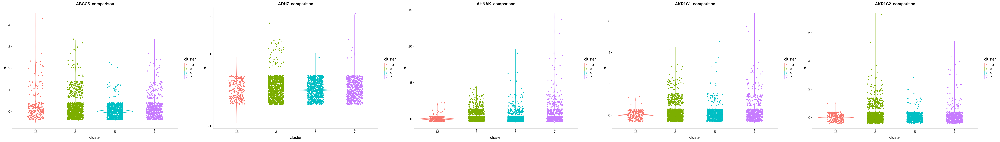

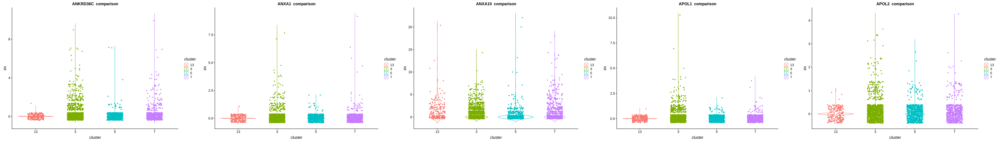

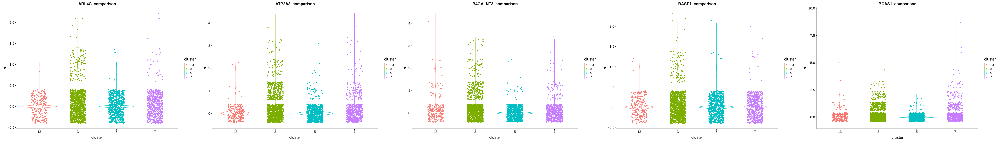

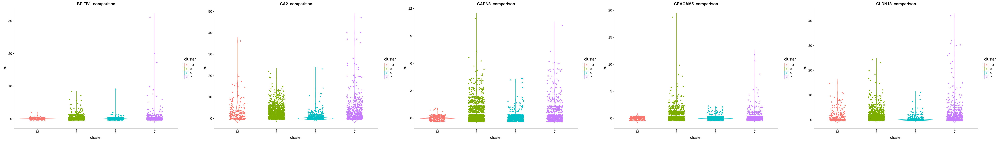

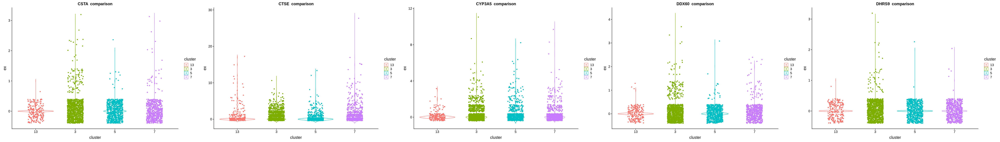

...

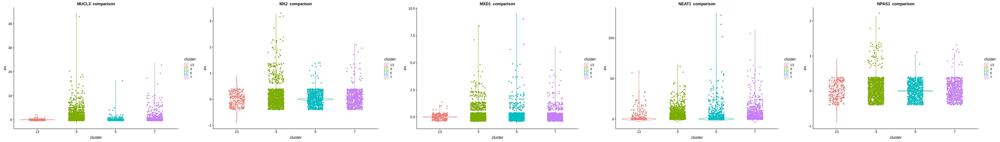

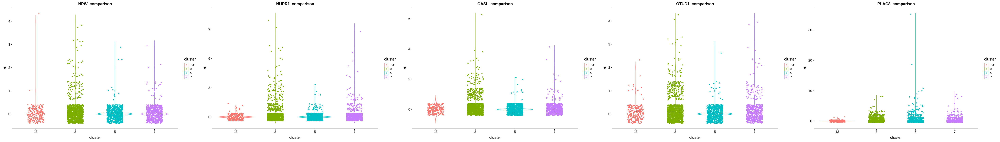

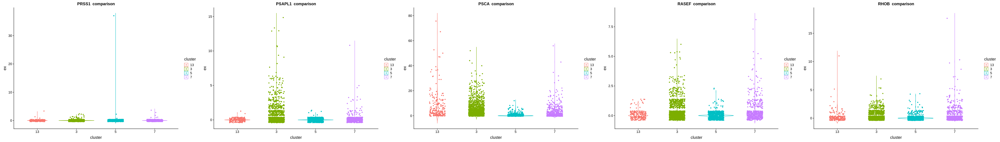

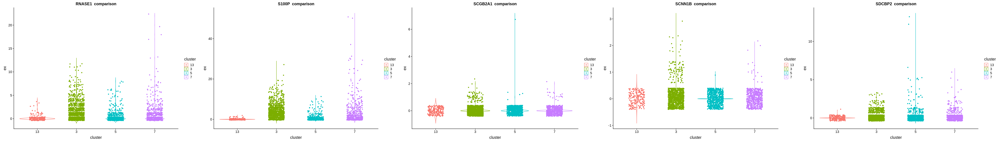

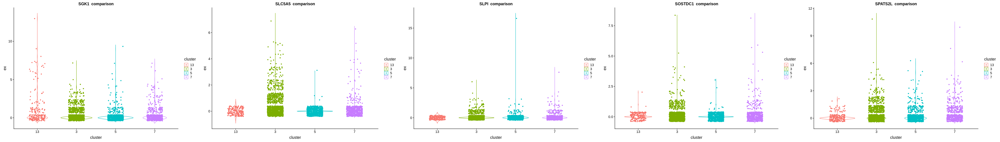

ERROR: Error in intI(i, n = x@Dim[1], dn[[1]], give.dn = FALSE): invalid character indexing


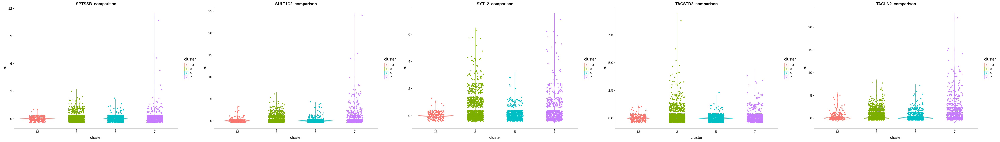

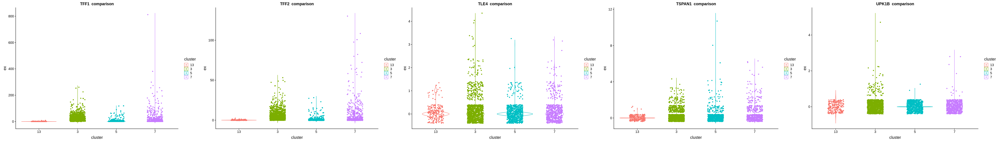

In [849]:
for (i in 0:19){
#1つめ
ensemble1 <- list3_ensemble$ensembl_gene_id[5*i+1]
df <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble1,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble1,]),
cbind(cluster="7",ex=mat_cluster7[ensemble1,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble1,])))

df$ex <- as.numeric(df$ex)
p1 <- ggplot(df,aes(x=cluster,y=ex,colour=cluster))
p1 <- p1+geom_violin(trim=FALSE)+labs(title=paste(list3_ensemble$hgnc_symbol[5*i+1],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 2つめ
ensemble2 <- list3_ensemble$ensembl_gene_id[5*i+2]
df2 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble2,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble2,]),
cbind(cluster="7",ex=mat_cluster7[ensemble2,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble2,])))
df2$ex <- as.numeric(df2$ex)
p2 <- ggplot(df2,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p2 <- p2+geom_violin(trim=FALSE)+labs(title=paste(list3_ensemble$hgnc_symbol[5*i+2],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# ３つ目
ensemble3 <- list3_ensemble$ensembl_gene_id[5*i+3]
df3 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble3,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble3,]),
cbind(cluster="7",ex=mat_cluster7[ensemble3,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble3,])))
df3$ex <- as.numeric(df3$ex)
p3 <- ggplot(df3,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p3 <- p3+geom_violin(trim=FALSE)+labs(title=paste(list3_ensemble$hgnc_symbol[5*i+3],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 4つめ
ensemble4 <- list3_ensemble$ensembl_gene_id[5*i+4]
df4 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble4,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble4,]),
cbind(cluster="7",ex=mat_cluster7[ensemble4,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble4,])))
df4$ex <- as.numeric(df4$ex)
p4 <- ggplot(df4,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p4 <- p4+geom_violin(trim=FALSE)+labs(title=paste(list3_ensemble$hgnc_symbol[5*i+4],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 5つめ
ensemble5 <- list3_ensemble$ensembl_gene_id[5*i+5]
df5 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble5,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble5,]),
cbind(cluster="7",ex=mat_cluster7[ensemble5,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble5,])))
df5$ex <- as.numeric(df5$ex)
p5 <- ggplot(df5,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p5 <- p5+geom_violin(trim=FALSE)+labs(title=paste(list3_ensemble$hgnc_symbol[5*i+5],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

gridExtra::grid.arrange(p1, p2, p3,p4,p5, ncol = 5)
    }

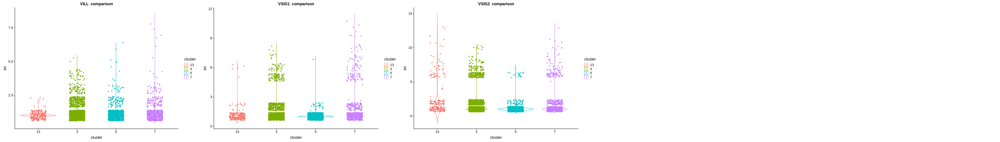

In [66]:
i=19
#1つめ
ensemble1 <- list3_ensemble$ensembl_gene_id[5*i+1]
df <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble1,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble1,]),
cbind(cluster="7",ex=mat_cluster7[ensemble1,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble1,])))

df$ex <- as.numeric(df$ex)
p1 <- ggplot(df,aes(x=cluster,y=ex,colour=cluster))
p1 <- p1+geom_violin(trim=FALSE)+labs(title=paste(list3_ensemble$hgnc_symbol[5*i+1],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 2つめ
ensemble2 <- list3_ensemble$ensembl_gene_id[5*i+2]
df2 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble2,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble2,]),
cbind(cluster="7",ex=mat_cluster7[ensemble2,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble2,])))
df2$ex <- as.numeric(df2$ex)
p2 <- ggplot(df2,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p2 <- p2+geom_violin(trim=FALSE)+labs(title=paste(list3_ensemble$hgnc_symbol[5*i+2],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# ３つ目
ensemble3 <- list3_ensemble$ensembl_gene_id[5*i+3]
df3 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble3,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble3,]),
cbind(cluster="7",ex=mat_cluster7[ensemble3,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble3,])))
df3$ex <- as.numeric(df3$ex)
p3 <- ggplot(df3,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p3 <- p3+geom_violin(trim=FALSE)+labs(title=paste(list3_ensemble$hgnc_symbol[5*i+3],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

plot_list[[96]] <- p1
plot_list[[97]] <- p2
plot_list[[98]] <- p3
gridExtra::grid.arrange(p1, p2, p3, ncol = 5)

In [297]:
length(plot_list)

[1] 92

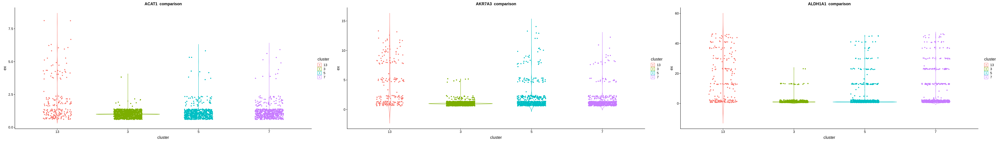

In [303]:
gridExtra::grid.arrange(plot_list[[1]],
plot_list[[2]], plot_list[[3]], ncol=3)

In [306]:
try(plot_list[[93]])

Error in plot_list[[93]] : subscript out of bounds


[1] "try-error"

In [312]:
3 %/% 1.2

[1] 2

In [881]:
library(Rmisc)

In [884]:
options(repr.plot.width=49, repr.plot.height=1000)

In [897]:
png(paste(list3_ensemble$hgnc_symbol[1],'.png',sep=''))
plot_list[[1]]

In [938]:
for (i in 1:length(plot_list)){
png(paste(list3_ensemble$hgnc_symbol[i],'.png',sep=''))
plot(plot_list[[i]])
dev.off()
}

# Cluster 5について

In [70]:
list5_unique = setdiff(setdiff(setdiff(list5$hgnc_symbol,list3$hgnc_symbol),list7$hgnc_symbol),list13$hgnc_symbol)

In [71]:
list5_genes <- list5_unique[!startsWith(list5_unique,'RPL')]

In [72]:
list5_genes <- list5_genes[!startsWith(list5_genes,'MT-')]

In [73]:
list5_genes <- list5_genes[!startsWith(list5_genes,'RPS')]

In [75]:
list5_genes <- list5_genes[-90]

In [85]:
length(list5_genes)

[1] 93

In [86]:
head(list5_genes)

[1] "AOC1"    "IL32"    "DPEP1"   "SLC7A9"  "CREB3L3" "OAT"

In [77]:
list5_ensemble <- getBM(filters= "hgnc_symbol", attributes=c("ensembl_gene_id",'hgnc_symbol'),
              values=list5_genes,mart=mart)

In [90]:
list5_ensemble <- na.omit(list5_ensemble)

In [125]:
options(repr.plot.width=49, repr.plot.height=7)

In [98]:
# mat_cluster3とlist3_ensembleの共通の遺伝子のみにする
ensembl_gene_id_T <- intersect(list5_ensemble$ensembl_gene_id, rownames(mat_cluster5))

for (i in 1:length(ensembl_gene_id_T)){
    ensembl <- ensembl_gene_id_T[i]
    if(i==1)hoge <- list5_ensemble[list5_ensemble$ensembl_gene_id==ensembl,]
    else{
        hoge <- rbind(hoge,list5_ensemble[list5_ensemble$ensembl_gene_id==ensembl,])
    }
}

list5_ensemble <- hoge

In [130]:
plot_list <- list()

In [99]:
length(ensembl_gene_id_T)

[1] 93

In [101]:
list5_ensemble <- na.omit(list5_ensemble)

In [103]:
dim(list5_ensemble)
head(list5_ensemble)

[1] 93  2

ensembl_gene_id,hgnc_symbol
<chr>,<chr>
ENSG00000118777,ABCG2
ENSG00000159640,ACE
ENSG00000130234,ACE2
ENSG00000197142,ACSL5
ENSG00000148671,ADIRF
ENSG00000169692,AGPAT2


In [133]:

for (i in 0:18){
#1つめ
ensemble1 <- list5_ensemble$ensembl_gene_id[5*i+1]
df <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble1,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble1,]),
cbind(cluster="7",ex=mat_cluster7[ensemble1,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble1,])))

df$ex <- as.numeric(df$ex)
p1 <- ggplot(df,aes(x=cluster,y=ex,colour=cluster))
p1 <- p1+geom_violin(trim=FALSE)+labs(title=paste(list5_ensemble$hgnc_symbol[5*i+1],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 2つめ
ensemble2 <- list5_ensemble$ensembl_gene_id[5*i+2]
df2 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble2,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble2,]),
cbind(cluster="7",ex=mat_cluster7[ensemble2,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble2,])))
df2$ex <- as.numeric(df2$ex)
p2 <- ggplot(df2,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p2 <- p2+geom_violin(trim=FALSE)+labs(title=paste(list5_ensemble$hgnc_symbol[5*i+2],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# ３つ目
ensemble3 <- list5_ensemble$ensembl_gene_id[5*i+3]
df3 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble3,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble3,]),
cbind(cluster="7",ex=mat_cluster7[ensemble3,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble3,])))
df3$ex <- as.numeric(df3$ex)
p3 <- ggplot(df3,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p3 <- p3+geom_violin(trim=FALSE)+labs(title=paste(list5_ensemble$hgnc_symbol[5*i+3],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 4つめ
ensemble4 <- list5_ensemble$ensembl_gene_id[5*i+4]
df4 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble4,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble4,]),
cbind(cluster="7",ex=mat_cluster7[ensemble4,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble4,])))
df4$ex <- as.numeric(df4$ex)
p4 <- ggplot(df4,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p4 <- p4+geom_violin(trim=FALSE)+labs(title=paste(list5_ensemble$hgnc_symbol[5*i+4],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 5つめ
ensemble5 <- list5_ensemble$ensembl_gene_id[5*i+5]
df5 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble5,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble5,]),
cbind(cluster="7",ex=mat_cluster7[ensemble5,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble5,])))
df5$ex <- as.numeric(df5$ex)
p5 <- ggplot(df5,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p5 <- p5+geom_violin(trim=FALSE)+labs(title=paste(list5_ensemble$hgnc_symbol[5*i+5],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

plot_list[[5*i+1]] <- p1
plot_list[[5*i+2]] <- p2
plot_list[[5*i+3]] <- p3
plot_list[[5*i+4]] <- p4
plot_list[[5*i+5]] <- p5
}

ERROR: Error in intI(i, n = x@Dim[1], dn[[1]], give.dn = FALSE): invalid character indexing


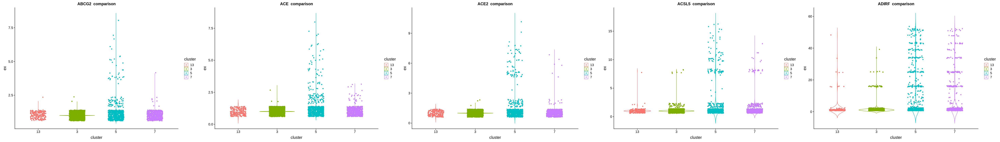

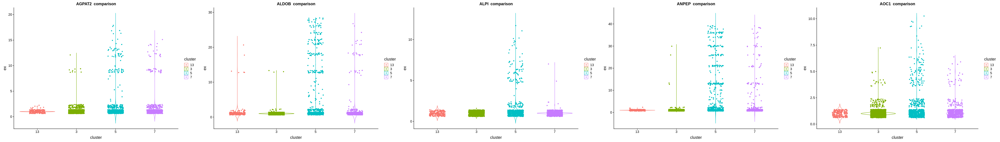

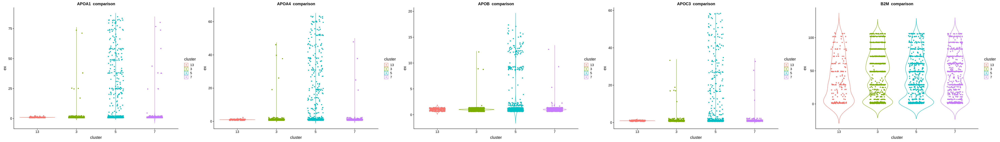

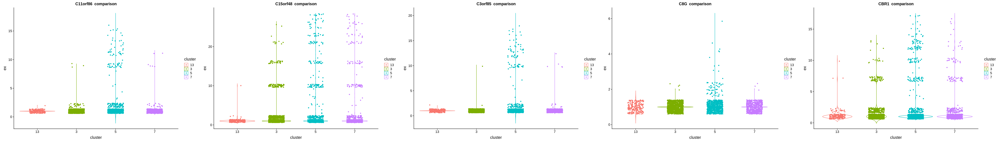

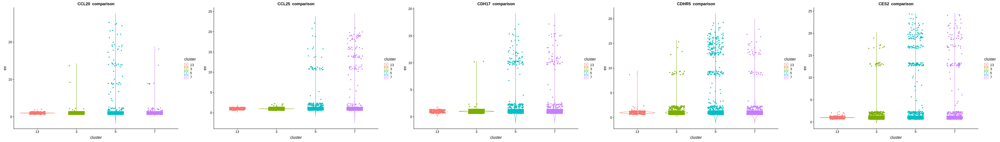

...

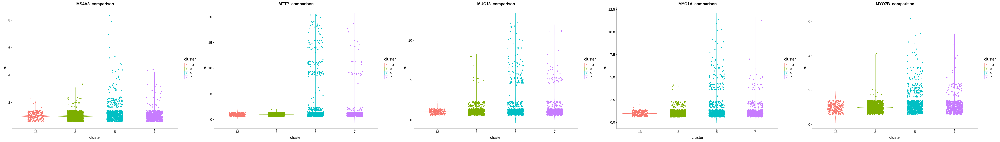

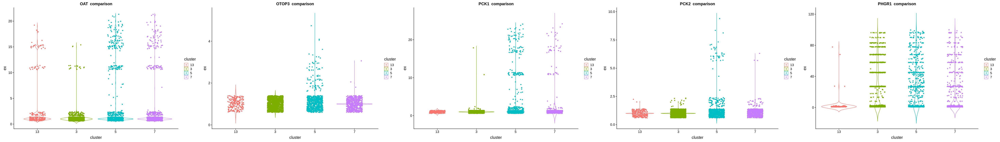

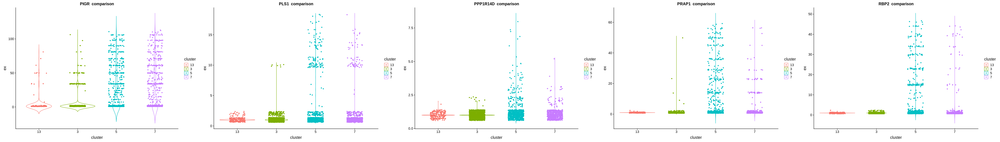

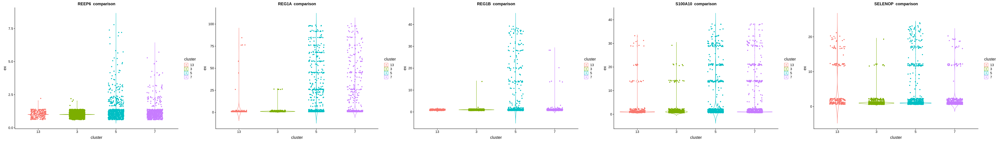

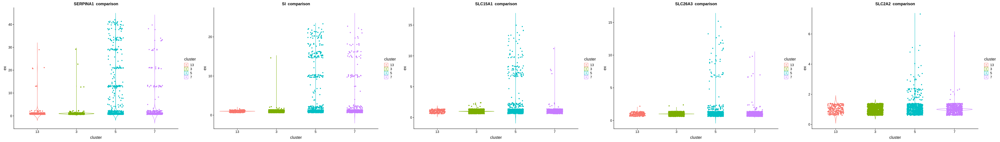

ERROR: Error in intI(i, n = x@Dim[1], dn[[1]], give.dn = FALSE): invalid character indexing


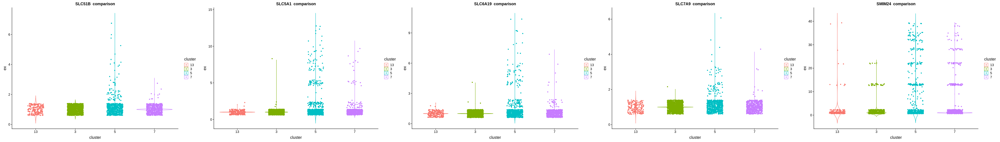

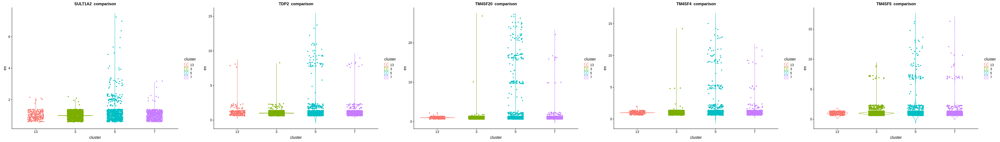

In [127]:
for (i in 0:18){
#1つめ
ensemble1 <- list5_ensemble$ensembl_gene_id[5*i+1]
df <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble1,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble1,]),
cbind(cluster="7",ex=mat_cluster7[ensemble1,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble1,])))

df$ex <- as.numeric(df$ex)
p1 <- ggplot(df,aes(x=cluster,y=ex,colour=cluster))
p1 <- p1+geom_violin(trim=FALSE)+labs(title=paste(list5_ensemble$hgnc_symbol[5*i+1],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 2つめ
ensemble2 <- list5_ensemble$ensembl_gene_id[5*i+2]
df2 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble2,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble2,]),
cbind(cluster="7",ex=mat_cluster7[ensemble2,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble2,])))
df2$ex <- as.numeric(df2$ex)
p2 <- ggplot(df2,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p2 <- p2+geom_violin(trim=FALSE)+labs(title=paste(list5_ensemble$hgnc_symbol[5*i+2],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# ３つ目
ensemble3 <- list5_ensemble$ensembl_gene_id[5*i+3]
df3 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble3,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble3,]),
cbind(cluster="7",ex=mat_cluster7[ensemble3,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble3,])))
df3$ex <- as.numeric(df3$ex)
p3 <- ggplot(df3,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p3 <- p3+geom_violin(trim=FALSE)+labs(title=paste(list5_ensemble$hgnc_symbol[5*i+3],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 4つめ
ensemble4 <- list5_ensemble$ensembl_gene_id[5*i+4]
df4 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble4,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble4,]),
cbind(cluster="7",ex=mat_cluster7[ensemble4,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble4,])))
df4$ex <- as.numeric(df4$ex)
p4 <- ggplot(df4,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p4 <- p4+geom_violin(trim=FALSE)+labs(title=paste(list5_ensemble$hgnc_symbol[5*i+4],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 5つめ
ensemble5 <- list5_ensemble$ensembl_gene_id[5*i+5]
df5 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble5,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble5,]),
cbind(cluster="7",ex=mat_cluster7[ensemble5,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble5,])))
df5$ex <- as.numeric(df5$ex)
p5 <- ggplot(df5,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p5 <- p5+geom_violin(trim=FALSE)+labs(title=paste(list5_ensemble$hgnc_symbol[5*i+5],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

gridExtra::grid.arrange(p1, p2, p3,p4,p5, ncol = 5)
    }

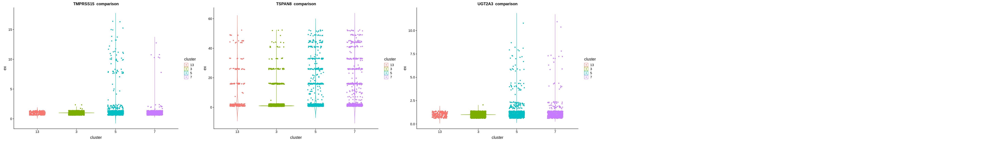

In [134]:
i=18
#1つめ
ensemble1 <- list5_ensemble$ensembl_gene_id[5*i+1]
df <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble1,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble1,]),
cbind(cluster="7",ex=mat_cluster7[ensemble1,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble1,])))

df$ex <- as.numeric(df$ex)
p1 <- ggplot(df,aes(x=cluster,y=ex,colour=cluster))
p1 <- p1+geom_violin(trim=FALSE)+labs(title=paste(list5_ensemble$hgnc_symbol[5*i+1],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 2つめ
ensemble2 <- list5_ensemble$ensembl_gene_id[5*i+2]
df2 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble2,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble2,]),
cbind(cluster="7",ex=mat_cluster7[ensemble2,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble2,])))
df2$ex <- as.numeric(df2$ex)
p2 <- ggplot(df2,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p2 <- p2+geom_violin(trim=FALSE)+labs(title=paste(list5_ensemble$hgnc_symbol[5*i+2],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# ３つ目
ensemble3 <- list5_ensemble$ensembl_gene_id[5*i+3]
df3 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble3,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble3,]),
cbind(cluster="7",ex=mat_cluster7[ensemble3,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble3,])))
df3$ex <- as.numeric(df3$ex)
p3 <- ggplot(df3,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p3 <- p3+geom_violin(trim=FALSE)+labs(title=paste(list5_ensemble$hgnc_symbol[5*i+3],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

plot_list[[91]] <- p1
plot_list[[92]] <- p2
plot_list[[93]] <- p3
gridExtra::grid.arrange(p1, p2, p3, ncol = 5)

In [118]:
library(gridExtra)


Attaching package: ‘gridExtra’

The following object is masked from ‘package:Biobase’:

    combine

The following object is masked from ‘package:BiocGenerics’:

    combine

The following object is masked from ‘package:dplyr’:

    combine



In [138]:
for (i in 1:length(plot_list)){
png(paste("./Violin//Metaplasia/",list5_ensemble$hgnc_symbol[i],'.png',sep=''))
plot(plot_list[[i]])
dev.off()
}

# Cluster 7

In [139]:
list7_unique = setdiff(setdiff(setdiff(list7$hgnc_symbol,list3$hgnc_symbol),list5$hgnc_symbol),list13$hgnc_symbol)

In [140]:
list7_genes <- list7_unique[!startsWith(list7_unique,'RPL')]

In [141]:
list7_genes <- list7_genes[!startsWith(list7_genes,'MT-')]

In [142]:
list7_genes <- list7_genes[!startsWith(list7_genes,'RPS')]

In [627]:
list7_genes

[1] "TMSB10"    "SLC12A2"   "LYZ"       "EEF1D"     "AGR2"      "EEF1B2"   
 [7] "NCL"       "HNRNPA2B1" "MT1G"      "PPDPF"     "HNRNPA1"   "FAU"      
[13] "EEF1A1"    "EEF2"      "HNRNPH1"   "MT1E"      "PTMA"      "HMGB1"    
[19] "PPIA"      "NACA"      "RACK1"     "UBA52"     "TMA7"

In [212]:
list7_ensemble <- getBM(filters= "hgnc_symbol", attributes=c("ensembl_gene_id",'hgnc_symbol'),
              values=list7_genes,mart=mart)

In [145]:
list7_ensemble

ensembl_gene_id,hgnc_symbol
<chr>,<chr>
ENSG00000106541,AGR2
ENSG00000156508,EEF1A1
ENSG00000114942,EEF1B2
ENSG00000283391,EEF1B2
ENSG00000273594,EEF1D
ENSG00000104529,EEF1D
ENSG00000167658,EEF2
ENSG00000149806,FAU
ENSG00000189403,HMGB1


In [214]:
options(repr.plot.width=49, repr.plot.height=7)

In [215]:
# mat_cluster3とlist3_ensembleの共通の遺伝子のみにする
ensembl_gene_id_T <- intersect(list7_ensemble$ensembl_gene_id, rownames(mat_cluster7))

for (i in 1:length(ensembl_gene_id_T)){
    ensembl <- ensembl_gene_id_T[i]
    if(i==1)hoge <- list7_ensemble[list7_ensemble$ensembl_gene_id==ensembl,]
    else{
        hoge <- rbind(hoge,list7_ensemble[list7_ensemble$ensembl_gene_id==ensembl,])
    }
}

list7_ensemble <- hoge

In [216]:
plot_list <- list()

In [217]:
length(ensembl_gene_id_T)

[1] 23

In [210]:
list7_ensemble <- na.omit(list7_ensemble)

In [218]:
list7_ensemble

,ensembl_gene_id,hgnc_symbol
,<chr>,<chr>
1,ENSG00000106541,AGR2
2,ENSG00000156508,EEF1A1
3,ENSG00000114942,EEF1B2
6,ENSG00000104529,EEF1D
7,ENSG00000167658,EEF2
8,ENSG00000149806,FAU
9,ENSG00000189403,HMGB1
10,ENSG00000135486,HNRNPA1
11,ENSG00000122566,HNRNPA2B1


In [219]:
i=0
for (i in 0:5){
#1つめ
ensemble1 <- list7_ensemble$ensembl_gene_id[5*i+1]
df <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble1,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble1,]),
cbind(cluster="7",ex=mat_cluster7[ensemble1,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble1,])))

df$ex <- as.numeric(df$ex)
p1 <- ggplot(df,aes(x=cluster,y=ex,colour=cluster))
p1 <- p1+geom_violin(trim=FALSE)+labs(title=paste(list7_ensemble$hgnc_symbol[5*i+1],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 2つめ
ensemble2 <- list7_ensemble$ensembl_gene_id[5*i+2]
df2 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble2,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble2,]),
cbind(cluster="7",ex=mat_cluster7[ensemble2,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble2,])))
df2$ex <- as.numeric(df2$ex)
p2 <- ggplot(df2,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p2 <- p2+geom_violin(trim=FALSE)+labs(title=paste(list7_ensemble$hgnc_symbol[5*i+2],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# ３つ目
ensemble3 <- list7_ensemble$ensembl_gene_id[5*i+3]
df3 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble3,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble3,]),
cbind(cluster="7",ex=mat_cluster7[ensemble3,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble3,])))
df3$ex <- as.numeric(df3$ex)
p3 <- ggplot(df3,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p3 <- p3+geom_violin(trim=FALSE)+labs(title=paste(list7_ensemble$hgnc_symbol[5*i+3],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 4つめ
ensemble4 <- list7_ensemble$ensembl_gene_id[5*i+4]
df4 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble4,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble4,]),
cbind(cluster="7",ex=mat_cluster7[ensemble4,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble4,])))
df4$ex <- as.numeric(df4$ex)
p4 <- ggplot(df4,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p4 <- p4+geom_violin(trim=FALSE)+labs(title=paste(list7_ensemble$hgnc_symbol[5*i+4],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 5つめ
ensemble5 <- list7_ensemble$ensembl_gene_id[5*i+5]
df5 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble5,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble5,]),
cbind(cluster="7",ex=mat_cluster7[ensemble5,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble5,])))
df5$ex <- as.numeric(df5$ex)
p5 <- ggplot(df5,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p5 <- p5+geom_violin(trim=FALSE)+labs(title=paste(list7_ensemble$hgnc_symbol[5*i+5],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

plot_list[[5*i+1]] <- p1
plot_list[[5*i+2]] <- p2
plot_list[[5*i+3]] <- p3
plot_list[[5*i+4]] <- p4
plot_list[[5*i+5]] <- p5
}

ERROR: Error in intI(i, n = x@Dim[1], dn[[1]], give.dn = FALSE): invalid character indexing


In [220]:
length(plot_list)

[1] 20

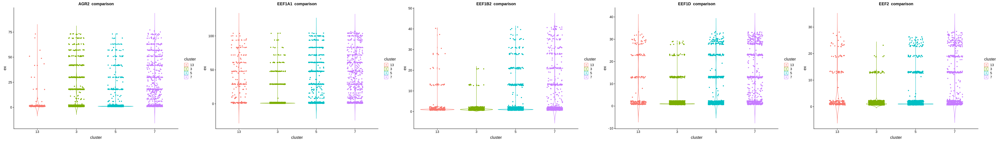

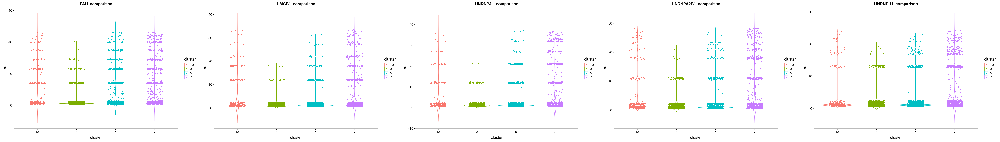

ERROR: Error in intI(i, n = x@Dim[1], dn[[1]], give.dn = FALSE): invalid character indexing


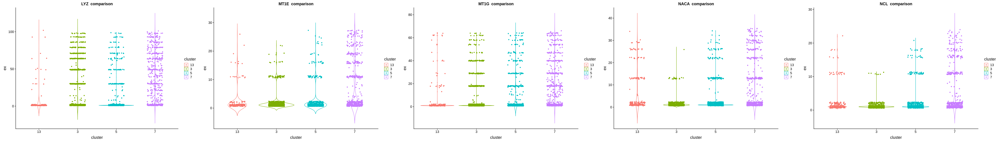

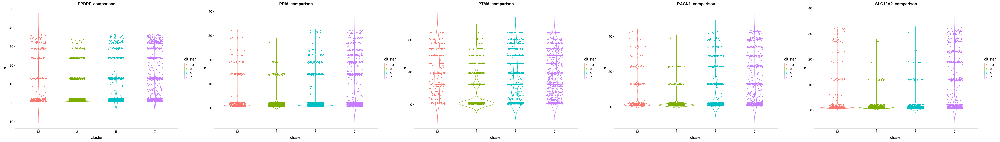

In [221]:
for (i in 0:5){
#1つめ
ensemble1 <- list7_ensemble$ensembl_gene_id[5*i+1]
df <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble1,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble1,]),
cbind(cluster="7",ex=mat_cluster7[ensemble1,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble1,])))

df$ex <- as.numeric(df$ex)
p1 <- ggplot(df,aes(x=cluster,y=ex,colour=cluster))
p1 <- p1+geom_violin(trim=FALSE)+labs(title=paste(list7_ensemble$hgnc_symbol[5*i+1],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 2つめ
ensemble2 <- list7_ensemble$ensembl_gene_id[5*i+2]
df2 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble2,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble2,]),
cbind(cluster="7",ex=mat_cluster7[ensemble2,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble2,])))
df2$ex <- as.numeric(df2$ex)
p2 <- ggplot(df2,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p2 <- p2+geom_violin(trim=FALSE)+labs(title=paste(list7_ensemble$hgnc_symbol[5*i+2],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# ３つ目
ensemble3 <- list7_ensemble$ensembl_gene_id[5*i+3]
df3 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble3,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble3,]),
cbind(cluster="7",ex=mat_cluster7[ensemble3,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble3,])))
df3$ex <- as.numeric(df3$ex)
p3 <- ggplot(df3,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p3 <- p3+geom_violin(trim=FALSE)+labs(title=paste(list7_ensemble$hgnc_symbol[5*i+3],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 4つめ
ensemble4 <- list7_ensemble$ensembl_gene_id[5*i+4]
df4 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble4,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble4,]),
cbind(cluster="7",ex=mat_cluster7[ensemble4,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble4,])))
df4$ex <- as.numeric(df4$ex)
p4 <- ggplot(df4,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p4 <- p4+geom_violin(trim=FALSE)+labs(title=paste(list7_ensemble$hgnc_symbol[5*i+4],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 5つめ
ensemble5 <- list7_ensemble$ensembl_gene_id[5*i+5]
df5 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble5,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble5,]),
cbind(cluster="7",ex=mat_cluster7[ensemble5,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble5,])))
df5$ex <- as.numeric(df5$ex)
p5 <- ggplot(df5,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p5 <- p5+geom_violin(trim=FALSE)+labs(title=paste(list7_ensemble$hgnc_symbol[5*i+5],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

gridExtra::grid.arrange(p1, p2, p3,p4,p5, ncol = 5)
    }

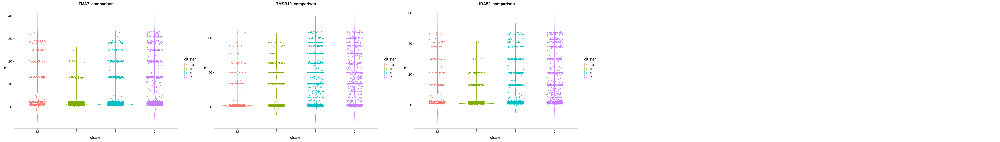

In [222]:
i=4
#1つめ
ensemble1 <- list7_ensemble$ensembl_gene_id[5*i+1]
df <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble1,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble1,]),
cbind(cluster="7",ex=mat_cluster7[ensemble1,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble1,])))

df$ex <- as.numeric(df$ex)
p1 <- ggplot(df,aes(x=cluster,y=ex,colour=cluster))
p1 <- p1+geom_violin(trim=FALSE)+labs(title=paste(list7_ensemble$hgnc_symbol[5*i+1],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 2つめ
ensemble2 <- list7_ensemble$ensembl_gene_id[5*i+2]
df2 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble2,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble2,]),
cbind(cluster="7",ex=mat_cluster7[ensemble2,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble2,])))
df2$ex <- as.numeric(df2$ex)
p2 <- ggplot(df2,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p2 <- p2+geom_violin(trim=FALSE)+labs(title=paste(list7_ensemble$hgnc_symbol[5*i+2],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# ３つ目
ensemble3 <- list7_ensemble$ensembl_gene_id[5*i+3]
df3 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble3,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble3,]),
cbind(cluster="7",ex=mat_cluster7[ensemble3,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble3,])))
df3$ex <- as.numeric(df3$ex)
p3 <- ggplot(df3,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p3 <- p3+geom_violin(trim=FALSE)+labs(title=paste(list7_ensemble$hgnc_symbol[5*i+3],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

plot_list[[21]] <- p1
plot_list[[22]] <- p2
plot_list[[23]] <- p3
gridExtra::grid.arrange(p1, p2, p3, ncol = 5)

In [118]:
library(gridExtra)


Attaching package: ‘gridExtra’

The following object is masked from ‘package:Biobase’:

    combine

The following object is masked from ‘package:BiocGenerics’:

    combine

The following object is masked from ‘package:dplyr’:

    combine



In [223]:
for (i in 1:length(plot_list)){
png(paste("./Violin//Chief//",list7_ensemble$hgnc_symbol[i],'.png',sep=''))
plot(plot_list[[i]])
dev.off()
}

# Cluster 13

In [224]:
list13_unique = setdiff(setdiff(setdiff(list13$hgnc_symbol,list3$hgnc_symbol),list5$hgnc_symbol),list7$hgnc_symbol)

In [225]:
list13_genes <- list13_unique[!startsWith(list13_unique,'RPL')]

In [226]:
list13_genes <- list13_genes[!startsWith(list13_genes,'MT-')]

In [227]:
list13_genes <- list13_genes[!startsWith(list13_genes,'RPS')]

In [233]:
length(list13_genes)

[1] 92

In [229]:
list13_ensemble <- getBM(filters= "hgnc_symbol", attributes=c("ensembl_gene_id",'hgnc_symbol'),
              values=list13_genes,mart=mart)

In [232]:
dim(list13_ensemble)

[1] 95  2

In [231]:
options(repr.plot.width=49, repr.plot.height=7)

In [234]:
# mat_cluster3とlist3_ensembleの共通の遺伝子のみにする
ensembl_gene_id_T <- intersect(list13_ensemble$ensembl_gene_id, rownames(mat_cluster13))

for (i in 1:98){
    ensembl <- ensembl_gene_id_T[i] 
    if(i==1)hoge <- list13_ensemble[list13_ensemble$ensembl_gene_id==ensembl,]
    else{
        hoge <- rbind(hoge,list13_ensemble[list13_ensemble$ensembl_gene_id==ensembl,])
    }
}

list13_ensemble <- hoge

plot_list <- list()

In [236]:
list13_ensemble <- na.omit(list13_ensemble)

In [237]:
dim(list13_ensemble)

[1] 92  2

In [238]:
for (i in 0:18){
#1つめ
ensemble1 <- list13_ensemble$ensembl_gene_id[5*i+1]
df <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble1,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble1,]),
cbind(cluster="7",ex=mat_cluster7[ensemble1,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble1,])))

df$ex <- as.numeric(df$ex)
p1 <- ggplot(df,aes(x=cluster,y=ex,colour=cluster))
p1 <- p1+geom_violin(trim=FALSE)+labs(title=paste(list13_ensemble$hgnc_symbol[5*i+1],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 2つめ
ensemble2 <- list13_ensemble$ensembl_gene_id[5*i+2]
df2 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble2,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble2,]),
cbind(cluster="7",ex=mat_cluster7[ensemble2,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble2,])))
df2$ex <- as.numeric(df2$ex)
p2 <- ggplot(df2,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p2 <- p2+geom_violin(trim=FALSE)+labs(title=paste(list13_ensemble$hgnc_symbol[5*i+2],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# ３つ目
ensemble3 <- list13_ensemble$ensembl_gene_id[5*i+3]
df3 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble3,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble3,]),
cbind(cluster="7",ex=mat_cluster7[ensemble3,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble3,])))
df3$ex <- as.numeric(df3$ex)
p3 <- ggplot(df3,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p3 <- p3+geom_violin(trim=FALSE)+labs(title=paste(list13_ensemble$hgnc_symbol[5*i+3],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 4つめ
ensemble4 <- list13_ensemble$ensembl_gene_id[5*i+4]
df4 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble4,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble4,]),
cbind(cluster="7",ex=mat_cluster7[ensemble4,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble4,])))
df4$ex <- as.numeric(df4$ex)
p4 <- ggplot(df4,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p4 <- p4+geom_violin(trim=FALSE)+labs(title=paste(list13_ensemble$hgnc_symbol[5*i+4],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 5つめ
ensemble5 <- list13_ensemble$ensembl_gene_id[5*i+5]
df5 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble5,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble5,]),
cbind(cluster="7",ex=mat_cluster7[ensemble5,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble5,])))
df5$ex <- as.numeric(df5$ex)
p5 <- ggplot(df5,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p5 <- p5+geom_violin(trim=FALSE)+labs(title=paste(list13_ensemble$hgnc_symbol[5*i+5],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

plot_list[[5*i+1]] <- p1
plot_list[[5*i+2]] <- p2
plot_list[[5*i+3]] <- p3
plot_list[[5*i+4]] <- p4
plot_list[[5*i+5]] <- p5
}

ERROR: Error in intI(i, n = x@Dim[1], dn[[1]], give.dn = FALSE): invalid character indexing


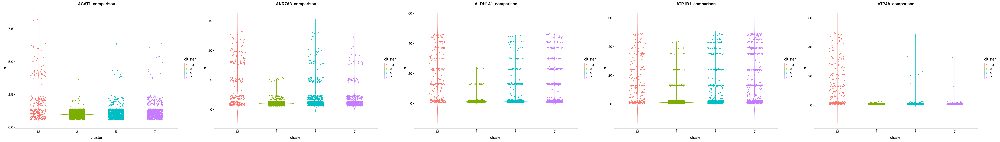

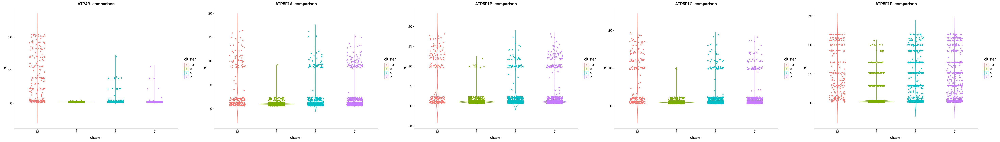

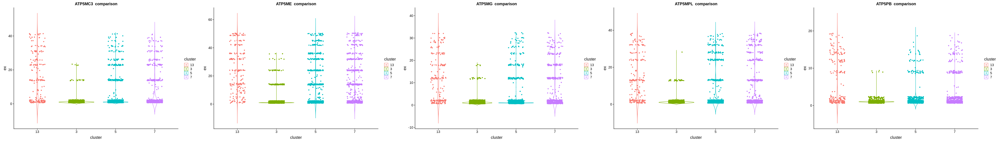

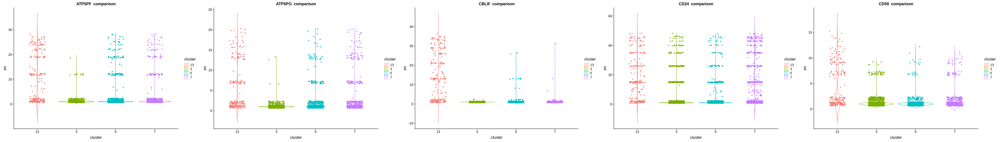

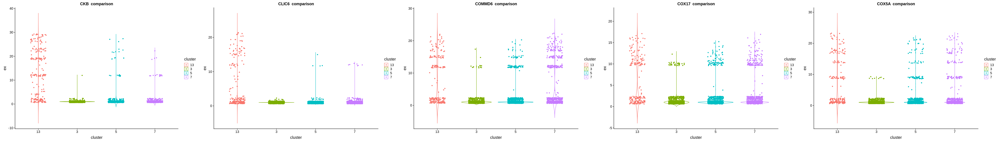

...

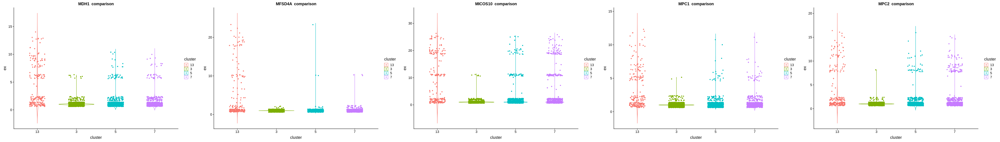

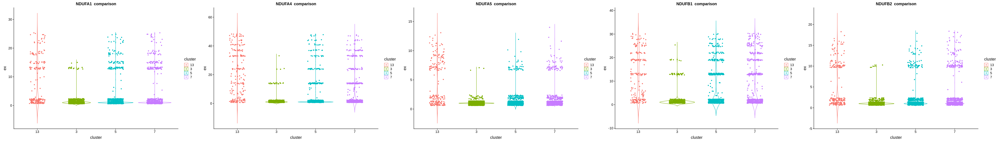

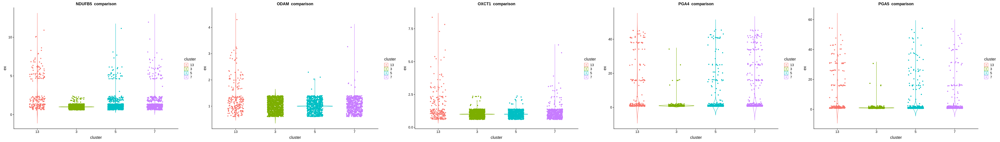

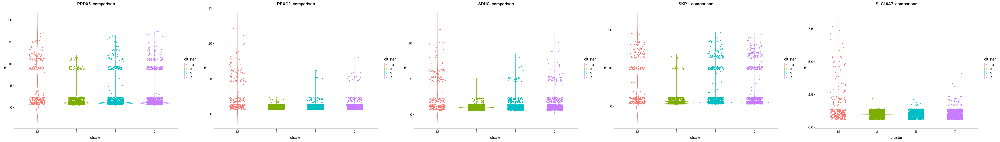

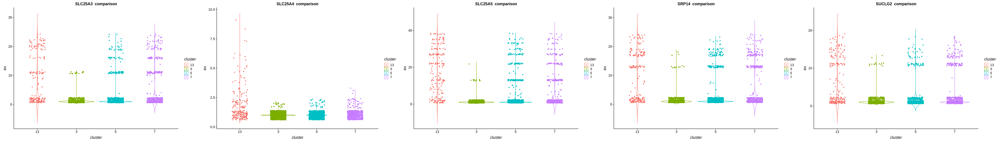

ERROR: Error in intI(i, n = x@Dim[1], dn[[1]], give.dn = FALSE): invalid character indexing


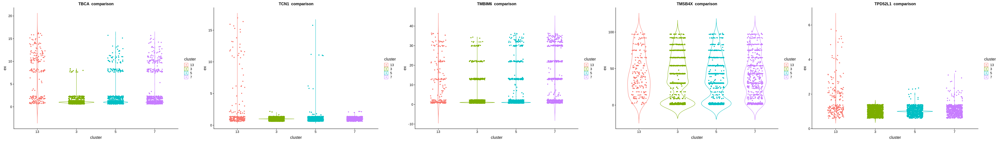

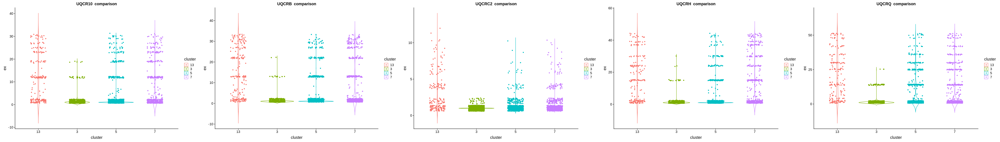

In [240]:
for (i in 0:18){
#1つめ
ensemble1 <- list13_ensemble$ensembl_gene_id[5*i+1]
df <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble1,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble1,]),
cbind(cluster="7",ex=mat_cluster7[ensemble1,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble1,])))

df$ex <- as.numeric(df$ex)
p1 <- ggplot(df,aes(x=cluster,y=ex,colour=cluster))
p1 <- p1+geom_violin(trim=FALSE)+labs(title=paste(list13_ensemble$hgnc_symbol[5*i+1],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 2つめ
ensemble2 <- list13_ensemble$ensembl_gene_id[5*i+2]
df2 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble2,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble2,]),
cbind(cluster="7",ex=mat_cluster7[ensemble2,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble2,])))
df2$ex <- as.numeric(df2$ex)
p2 <- ggplot(df2,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p2 <- p2+geom_violin(trim=FALSE)+labs(title=paste(list13_ensemble$hgnc_symbol[5*i+2],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# ３つ目
ensemble3 <- list13_ensemble$ensembl_gene_id[5*i+3]
df3 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble3,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble3,]),
cbind(cluster="7",ex=mat_cluster7[ensemble3,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble3,])))
df3$ex <- as.numeric(df3$ex)
p3 <- ggplot(df3,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p3 <- p3+geom_violin(trim=FALSE)+labs(title=paste(list13_ensemble$hgnc_symbol[5*i+3],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 4つめ
ensemble4 <- list13_ensemble$ensembl_gene_id[5*i+4]
df4 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble4,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble4,]),
cbind(cluster="7",ex=mat_cluster7[ensemble4,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble4,])))
df4$ex <- as.numeric(df4$ex)
p4 <- ggplot(df4,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p4 <- p4+geom_violin(trim=FALSE)+labs(title=paste(list13_ensemble$hgnc_symbol[5*i+4],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 5つめ
ensemble5 <- list13_ensemble$ensembl_gene_id[5*i+5]
df5 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble5,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble5,]),
cbind(cluster="7",ex=mat_cluster7[ensemble5,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble5,])))
df5$ex <- as.numeric(df5$ex)
p5 <- ggplot(df5,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p5 <- p5+geom_violin(trim=FALSE)+labs(title=paste(list13_ensemble$hgnc_symbol[5*i+5],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

gridExtra::grid.arrange(p1, p2, p3,p4,p5, ncol = 5)
    }

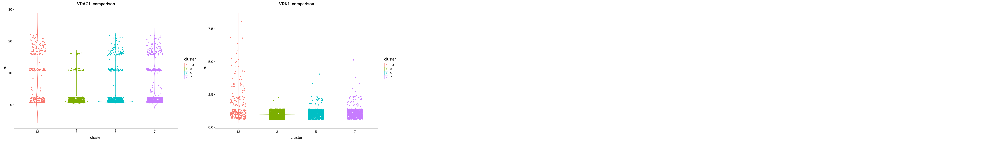

In [242]:
i=18
#1つめ
ensemble1 <- list13_ensemble$ensembl_gene_id[5*i+1]
df <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble1,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble1,]),
cbind(cluster="7",ex=mat_cluster7[ensemble1,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble1,])))

df$ex <- as.numeric(df$ex)
p1 <- ggplot(df,aes(x=cluster,y=ex,colour=cluster))
p1 <- p1+geom_violin(trim=FALSE)+labs(title=paste(list13_ensemble$hgnc_symbol[5*i+1],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 2つめ
ensemble2 <- list13_ensemble$ensembl_gene_id[5*i+2]
df2 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble2,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble2,]),
cbind(cluster="7",ex=mat_cluster7[ensemble2,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble2,])))
df2$ex <- as.numeric(df2$ex)
p2 <- ggplot(df2,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p2 <- p2+geom_violin(trim=FALSE)+labs(title=paste(list13_ensemble$hgnc_symbol[5*i+2],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

plot_list[[91]] <- p1
plot_list[[92]] <- p2

gridExtra::grid.arrange(p1, p2, ncol = 5)

In [243]:
length(plot_list)

[1] 92

In [881]:
library(Rmisc)

In [884]:
options(repr.plot.width=49, repr.plot.height=1000)

In [245]:
for (i in 1:length(plot_list)){
png(paste("./Violin/Parietal/",list13_ensemble$hgnc_symbol[i],'.png',sep=''))
plot(plot_list[[i]])
dev.off()
}

# GO　見てみる

In [467]:
library(biomaRt)

In [474]:
library(enrichR)

In [477]:
dbs <- c("GO_Molecular_Function_2018", "GO_Cellular_Component_2018", "GO_Biological_Process_2018")

## Cluster 3

In [634]:
enriched <- enrichr(list3_genes, dbs)

Uploading data to Enrichr... Done.
  Querying GO_Molecular_Function_2018... Done.
  Querying GO_Cellular_Component_2018... Done.
  Querying GO_Biological_Process_2018... Done.
Parsing results... Done.


In [635]:
enriched$GO_Biological_Process_2018[enriched$GO_Biological_Process_2018$Adjusted.P.value<=0.05,]

,Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Z.score,Combined.Score,Genes
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,progesterone metabolic process (GO:0042448),3/12,2.430673e-05,0.0056553651,6.489119e-05,0.0150980160,-2.626991,27.91115,DHRS9;AKR1C1;AKR1C2
4,epithelium development (GO:0060429),6/116,2.278959e-05,0.0056553651,4.892016e-05,0.0150980160,-1.985922,21.22793,UPK1B;ELF3;DHRS9;AKR1C1;AKR1C2;TAGLN2
6,response to organophosphorus (GO:0046683),3/19,1.044245e-04,0.0182220771,2.137578e-04,0.0373007332,-2.314409,21.21629,JUN;AKR1C1;DUOX2
7,epithelial cell differentiation (GO:0030855),7/97,4.893040e-07,0.0003415342,1.379014e-06,0.0009625517,-1.324792,19.24961,UPK1B;ELF3;DHRS9;BASP1;AKR1C1;AKR1C2;TAGLN2
8,C21-steroid hormone metabolic process (GO:0008207),3/23,1.881561e-04,0.0262665935,3.553488e-04,0.0496066937,-2.097866,17.99600,DHRS9;AKR1C1;AKR1C2


In [636]:
enriched$GO_Cellular_Component_2018[enriched$GO_Cellular_Component_2018$Adjusted.P.value<=0.05,]

Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Z.score,Combined.Score,Genes
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>


In [637]:
enriched$GO_Molecular_Function_2018[enriched$GO_Molecular_Function_2018$Adjusted.P.value<=0.05,]

Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Z.score,Combined.Score,Genes
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
ketosteroid monooxygenase activity (GO:0047086),2/7,0.0004911604,0.03576548,0.0010334233,0.06702112,-3.179894,24.22678,AKR1C1;AKR1C2
bile acid binding (GO:0032052),2/9,0.0008366194,0.03576548,0.0015677455,0.06702112,-2.985150,21.15319,AKR1C1;AKR1C2
alcohol dehydrogenase (NAD) activity (GO:0004022),2/9,0.0008366194,0.03576548,0.0015677455,0.06702112,-2.966552,21.02140,DHRS9;ADH7
"steroid dehydrogenase activity, acting on the CH-OH group of donors, NAD or NADP as acceptor (GO:0033764)",3/22,0.0001641968,0.02807766,0.0003288496,0.05623327,-2.369263,20.64681,DHRS9;AKR1C1;AKR1C2


## Cluster 5

In [638]:
enriched <- enrichr(list5_genes, dbs)

Uploading data to Enrichr... Done.
  Querying GO_Molecular_Function_2018... Done.
  Querying GO_Cellular_Component_2018... Done.
  Querying GO_Biological_Process_2018... Done.
Parsing results... Done.


In [639]:
enriched$GO_Biological_Process_2018[enriched$GO_Biological_Process_2018$Adjusted.P.value<=0.05,]

,Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Z.score,Combined.Score,Genes
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,chylomicron assembly (GO:0034378),4/11,1.410062e-07,2.316027e-05,9.082257e-07,1.320750e-04,-2.673077,42.16635,APOC3;APOA1;APOA4;APOB
2,chylomicron remodeling (GO:0034371),4/10,9.005168e-08,1.972132e-05,6.686846e-07,1.320750e-04,-2.545503,41.29540,APOC3;APOA1;APOA4;APOB
3,angiotensin maturation (GO:0002003),4/12,2.107568e-07,2.769344e-05,1.206165e-06,1.320750e-04,-2.656351,40.83492,ACE2;ENPEP;ACE;MME
4,triglyceride-rich lipoprotein particle remodeling (GO:0034370),4/14,4.231701e-07,3.475285e-05,2.011895e-06,1.652269e-04,-2.203606,32.33900,APOC3;APOA1;APOA4;APOB
5,regulation of triglyceride catabolic process (GO:0010896),3/11,1.563261e-05,4.279426e-04,4.823235e-05,1.376396e-03,-2.705684,29.94151,APOC3;APOA1;APOA4
6,very-low-density lipoprotein particle assembly (GO:0034379),3/11,1.563261e-05,4.279426e-04,4.823235e-05,1.376396e-03,-2.690249,29.77071,DGAT1;APOC3;APOB
7,acylglycerol catabolic process (GO:0046464),5/31,3.011459e-07,2.847095e-05,1.146099e-06,1.320750e-04,-1.980647,29.74074,FABP1;FABP2;APOC3;APOA1;APOA4
8,peptide catabolic process (GO:0043171),4/26,6.055688e-06,2.652391e-04,1.717995e-05,7.749990e-04,-2.439713,29.31196,ACE2;ENPEP;ACE;ANPEP
9,triglyceride catabolic process (GO:0019433),5/23,6.141523e-08,1.972132e-05,3.086986e-07,1.014075e-04,-1.751713,29.08825,FABP1;FABP2;APOC3;APOA1;APOA4


In [640]:
enriched$GO_Cellular_Component_2018[enriched$GO_Cellular_Component_2018$Adjusted.P.value<=0.05,]

,Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Z.score,Combined.Score,Genes
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,very-low-density lipoprotein particle (GO:0034361),4/16,7.639370e-07,8.097732e-05,6.396463e-06,0.0006780251,-2.003504,28.218917,APOC3;APOA1;APOA4;APOB
2,endocytic vesicle lumen (GO:0071682),2/19,3.474234e-03,3.347899e-02,7.613228e-03,0.0947469848,-2.489176,14.094665,APOA1;APOB
3,spherical high-density lipoprotein particle (GO:0034366),2/9,7.538902e-04,2.225626e-02,2.076194e-03,0.0870663673,-1.826543,13.133323,APOC3;APOA1
5,specific granule lumen (GO:0035580),3/63,3.159265e-03,3.347899e-02,8.234049e-03,0.0947469848,-1.935992,11.146308,AOC1;B2M;CTSD
6,specific granule (GO:0042581),5/161,9.334683e-04,2.225626e-02,3.817804e-03,0.0870663673,-1.591564,11.103713,AOC1;DGAT1;AGPAT2;B2M;CTSD
8,microvillus (GO:0005902),3/43,1.049823e-03,2.225626e-02,2.984985e-03,0.0870663673,-1.605127,11.009782,MYO1A;MYO7B;CDHR5
9,endosome lumen (GO:0031904),2/25,5.985780e-03,4.532090e-02,1.242110e-02,0.1152897072,-2.048799,10.486510,APOB;B2M
12,COPII-coated ER to Golgi transport vesicle (GO:0030134),3/76,5.355303e-03,4.366632e-02,1.343488e-02,0.1152897072,-1.937429,10.132111,SERPINA1;HLA-DRA;B2M
15,endoplasmic reticulum lumen (GO:0005788),6/271,1.667703e-03,2.946275e-02,7.687594e-03,0.0947469848,-1.483972,9.491943,SERPINA1;APOA1;APOA4;APOB;B2M;CES2


In [641]:
enriched$GO_Molecular_Function_2018[enriched$GO_Molecular_Function_2018$Adjusted.P.value<=0.05,]

,Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Z.score,Combined.Score,Genes
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,estradiol 17-beta-dehydrogenase activity (GO:0004303),2/8,5.881395e-04,7.876536e-03,1.207693e-03,1.529744e-02,-4.717497,35.09132,HSD17B2;HSD17B11
2,cholesterol transporter activity (GO:0017127),4/18,1.275303e-06,6.461536e-05,4.846196e-06,2.455406e-04,-2.109669,28.63311,APOA1;APOA4;APOB;ABCG2
3,exopeptidase activity (GO:0008238),6/46,6.923048e-08,5.261516e-06,2.887203e-07,2.194275e-05,-1.701910,28.05738,ACE2;ENPEP;ACE;MME;ANPEP;DPEP1
4,phosphatidylcholine-sterol O-acyltransferase activator activity (GO:0060228),2/7,4.424446e-04,6.725157e-03,9.694564e-04,1.473574e-02,-2.830015,21.85676,APOA1;APOA4
5,transition metal ion binding (GO:0046914),14/400,4.619017e-09,7.020906e-07,2.317184e-08,3.522120e-06,-1.132719,21.74036,ENPEP;AOC1;ACE;MME;APOA4;CYP3A4;ACE2;TDP2;ANPEP;DPEP1;ALPI;PCK1;PCK2;FTL
6,sterol transporter activity (GO:0015248),4/29,9.518498e-06,2.893623e-04,2.595434e-05,7.890119e-04,-1.849615,21.38575,APOA1;APOA4;APOB;ABCG2
7,peptidoglycan binding (GO:0042834),3/17,6.313396e-05,1.599394e-03,1.510415e-04,3.826386e-03,-2.199677,21.27143,IGHM;REG1B;REG1A
8,dipeptidase activity (GO:0016805),2/11,1.144817e-03,1.242944e-02,2.072031e-03,2.249634e-02,-2.812958,19.05079,ACE;DPEP1
9,metalloexopeptidase activity (GO:0008235),5/55,5.646439e-06,2.145647e-04,1.538791e-05,5.847404e-04,-1.517487,18.33805,ACE2;ENPEP;ACE;ANPEP;DPEP1


## Cluster 7

In [642]:
enriched <- enrichr(list7_genes, dbs)

Uploading data to Enrichr... Done.
  Querying GO_Molecular_Function_2018... Done.
  Querying GO_Cellular_Component_2018... Done.
  Querying GO_Biological_Process_2018... Done.
Parsing results... Done.


In [643]:
enriched$GO_Biological_Process_2018[enriched$GO_Biological_Process_2018$Adjusted.P.value<=0.05,]

,Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Z.score,Combined.Score,Genes
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,negative regulation of phagocytosis (GO:0050765),2/10,5.660985e-05,7.926201e-03,1.190788e-04,0.0169039041,-2.688634,26.293029,RACK1;HMGB1
2,translational elongation (GO:0006414),5/106,1.185910e-07,5.692369e-05,3.451329e-07,0.0001656638,-1.315487,20.978834,EEF1B2;EEF1A1;EEF1D;RACK1;EEF2
3,virion assembly (GO:0019068),2/18,1.913988e-04,7.926201e-03,3.405336e-04,0.0169039041,-2.250405,19.266055,UBA52;PPIA
5,positive regulation of epidermal growth factor receptor signaling pathway (GO:0045742),2/30,5.396240e-04,1.177362e-02,8.801648e-04,0.0190820926,-2.427288,18.264461,AGR2;UBA52
6,cellular macromolecule biosynthetic process (GO:0034645),5/368,5.256187e-05,7.926201e-03,1.254914e-04,0.0169039041,-1.761425,17.356233,EEF1B2;EEF1A1;EEF1D;EEF2;PTMA
7,cellular response to zinc ion (GO:0071294),2/20,2.373524e-04,8.763780e-03,4.133306e-04,0.0169039041,-2.067145,17.252320,MT1G;MT1E
8,neutrophil degranulation (GO:0043312),5/480,1.834829e-04,7.926201e-03,4.253921e-04,0.0169039041,-2.004472,17.245249,EEF1A1;HMGB1;EEF2;LYZ;PPIA
9,neutrophil mediated immunity (GO:0002446),5/488,1.981550e-04,7.926201e-03,4.585703e-04,0.0169039041,-1.929251,16.449684,EEF1A1;HMGB1;EEF2;LYZ;PPIA
10,response to copper ion (GO:0046688),2/26,4.042969e-04,1.078125e-02,6.730002e-04,0.0179466713,-2.091810,16.344069,MT1G;MT1E


In [644]:
enriched$GO_Cellular_Component_2018[enriched$GO_Cellular_Component_2018$Adjusted.P.value<=0.05,]

Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Z.score,Combined.Score,Genes
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
ficolin-1-rich granule lumen (GO:1904813),4/124,1.137673e-05,0.0002948132,4.047948e-05,0.001041733,-2.285298,26.01570,EEF1A1;HMGB1;EEF2;PPIA
cytoplasmic vesicle lumen (GO:0060205),4/130,1.371224e-05,0.0002948132,4.845271e-05,0.001041733,-1.521379,17.03522,EEF1A1;HMGB1;EEF2;PPIA
secretory granule lumen (GO:0034774),5/318,2.618817e-05,0.0003753637,1.055868e-04,0.001513411,-1.290574,13.61582,EEF1A1;HMGB1;EEF2;LYZ;PPIA
ficolin-1-rich granule (GO:0101002),4/185,5.468696e-05,0.0005878848,1.845992e-04,0.001984441,-1.261400,12.37923,EEF1A1;HMGB1;EEF2;PPIA


In [645]:
enriched$GO_Molecular_Function_2018[enriched$GO_Molecular_Function_2018$Adjusted.P.value<=0.05,]

,Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Z.score,Combined.Score,Genes
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,G-rich strand telomeric DNA binding (GO:0098505),2/11,6.914140e-05,1.689533e-03,2.003122e-04,0.0045474638,-2.967676,28.428431,HNRNPA2B1;HNRNPA1
2,translation elongation factor activity (GO:0003746),2/14,1.141576e-04,1.689533e-03,3.072611e-04,0.0045474638,-2.722458,24.714282,EEF1B2;EEF1A1
3,single-stranded telomeric DNA binding (GO:0043047),2/13,9.791790e-05,1.689533e-03,2.691190e-04,0.0045474638,-2.569892,23.723652,HNRNPA2B1;HNRNPA1
4,RNA binding (GO:0003723),11/1388,1.073504e-07,7.943930e-06,2.520483e-06,0.0001865157,-1.372510,22.024902,EEF1A1;HNRNPH1;EEF1D;NCL;HNRNPA2B1;RACK1;HMGB1;FAU;EEF2;HNRNPA1;PPIA
5,miRNA binding (GO:0035198),2/25,3.734583e-04,4.605985e-03,8.890342e-04,0.0109647557,-2.304299,18.187154,HNRNPA2B1;HNRNPA1
6,telomeric DNA binding (GO:0042162),2/33,6.536193e-04,6.909689e-03,1.495207e-03,0.0158064716,-1.989986,14.592538,NCL;HNRNPA2B1
13,"translation factor activity, RNA binding (GO:0008135)",3/68,6.340820e-05,1.689533e-03,2.047131e-04,0.0045474638,-1.238390,11.970178,EEF1B2;EEF1A1;EEF1D
16,cadherin binding (GO:0045296),3/314,5.378395e-03,3.980012e-02,1.456428e-02,0.0835579841,-1.972585,10.307475,EEF1D;RACK1;EEF2
17,single-stranded DNA binding (GO:0003697),2/88,4.560205e-03,3.749502e-02,9.533906e-03,0.0783898910,-1.906521,10.276889,HMGB1;HNRNPA1


## Custer 13

In [650]:
enriched <- enrichr(list13_genes, dbs)

Uploading data to Enrichr... Done.
  Querying GO_Molecular_Function_2018... Done.
  Querying GO_Cellular_Component_2018... Done.
  Querying GO_Biological_Process_2018... Done.
Parsing results... Done.


In [651]:
enriched$GO_Biological_Process_2018[enriched$GO_Biological_Process_2018$Adjusted.P.value<=0.05,]

,Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Z.score,Combined.Score,Genes
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,progesterone metabolic process (GO:0042448),3/12,2.430673e-05,0.0056553651,6.489119e-05,0.0150980160,-2.626991,27.91115,DHRS9;AKR1C1;AKR1C2
4,epithelium development (GO:0060429),6/116,2.278959e-05,0.0056553651,4.892016e-05,0.0150980160,-1.985922,21.22793,UPK1B;ELF3;DHRS9;AKR1C1;AKR1C2;TAGLN2
6,response to organophosphorus (GO:0046683),3/19,1.044245e-04,0.0182220771,2.137578e-04,0.0373007332,-2.314409,21.21629,JUN;AKR1C1;DUOX2
7,epithelial cell differentiation (GO:0030855),7/97,4.893040e-07,0.0003415342,1.379014e-06,0.0009625517,-1.324792,19.24961,UPK1B;ELF3;DHRS9;BASP1;AKR1C1;AKR1C2;TAGLN2
8,C21-steroid hormone metabolic process (GO:0008207),3/23,1.881561e-04,0.0262665935,3.553488e-04,0.0496066937,-2.097866,17.99600,DHRS9;AKR1C1;AKR1C2


In [652]:
enriched$GO_Cellular_Component_2018[enriched$GO_Cellular_Component_2018$Adjusted.P.value<=0.05,]

Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Z.score,Combined.Score,Genes
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>


In [653]:
enriched$GO_Molecular_Function_2018[enriched$GO_Molecular_Function_2018$Adjusted.P.value<=0.05,]

Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Z.score,Combined.Score,Genes
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
ketosteroid monooxygenase activity (GO:0047086),2/7,0.0004911604,0.03576548,0.0010334233,0.06702112,-3.179894,24.22678,AKR1C1;AKR1C2
bile acid binding (GO:0032052),2/9,0.0008366194,0.03576548,0.0015677455,0.06702112,-2.985150,21.15319,AKR1C1;AKR1C2
alcohol dehydrogenase (NAD) activity (GO:0004022),2/9,0.0008366194,0.03576548,0.0015677455,0.06702112,-2.966552,21.02140,DHRS9;ADH7
"steroid dehydrogenase activity, acting on the CH-OH group of donors, NAD or NADP as acceptor (GO:0033764)",3/22,0.0001641968,0.02807766,0.0003288496,0.05623327,-2.369263,20.64681,DHRS9;AKR1C1;AKR1C2
